# Machine Learning Engineer Nanodegree
## Reinforcement Learning
## Project: Train a Smartcab to Drive

Welcome to the fourth project of the Machine Learning Engineer Nanodegree! In this notebook, template code has already been provided for you to aid in your analysis of the *Smartcab* and your implemented learning algorithm. You will not need to modify the included code beyond what is requested. There will be questions that you must answer which relate to the project and the visualizations provided in the notebook. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide in `agent.py`.  

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

-----

## Getting Started
In this project, you will work towards constructing an optimized Q-Learning driving agent that will navigate a *Smartcab* through its environment towards a goal. Since the *Smartcab* is expected to drive passengers from one location to another, the driving agent will be evaluated on two very important metrics: **Safety** and **Reliability**. A driving agent that gets the *Smartcab* to its destination while running red lights or narrowly avoiding accidents would be considered **unsafe**. Similarly, a driving agent that frequently fails to reach the destination in time would be considered **unreliable**. Maximizing the driving agent's **safety** and **reliability** would ensure that *Smartcabs* have a permanent place in the transportation industry.

**Safety** and **Reliability** are measured using a letter-grade system as follows:

| Grade 	| Safety 	| Reliability 	|
|:-----:	|:------:	|:-----------:	|
|   A+  	|  Agent commits no traffic violations,<br/>and always chooses the correct action. | Agent reaches the destination in time<br />for 100% of trips. |
|   A   	|  Agent commits few minor traffic violations,<br/>such as failing to move on a green light. | Agent reaches the destination on time<br />for at least 90% of trips. |
|   B   	| Agent commits frequent minor traffic violations,<br/>such as failing to move on a green light. | Agent reaches the destination on time<br />for at least 80% of trips. |
|   C   	|  Agent commits at least one major traffic violation,<br/> such as driving through a red light. | Agent reaches the destination on time<br />for at least 70% of trips. |
|   D   	| Agent causes at least one minor accident,<br/> such as turning left on green with oncoming traffic.       	| Agent reaches the destination on time<br />for at least 60% of trips. |
|   F   	|  Agent causes at least one major accident,<br />such as driving through a red light with cross-traffic.      	| Agent fails to reach the destination on time<br />for at least 60% of trips. |

To assist evaluating these important metrics, you will need to load visualization code that will be used later on in the project. Run the code cell below to import this code which is required for your analysis.

In [1]:
# Import the visualization code
import visuals as vs

# Pretty display for notebooks
%matplotlib inline

### Understand the World
Before starting to work on implementing your driving agent, it's necessary to first understand the world (environment) which the *Smartcab* and driving agent work in. One of the major components to building a self-learning agent is understanding the characteristics about the agent, which includes how the agent operates. To begin, simply run the `agent.py` agent code exactly how it is -- no need to make any additions whatsoever. Let the resulting simulation run for some time to see the various working components. Note that in the visual simulation (if enabled), the **white vehicle** is the *Smartcab*.

### Question 1
In a few sentences, describe what you observe during the simulation when running the default `agent.py` agent code. Some things you could consider:
- *Does the Smartcab move at all during the simulation?*
- *What kind of rewards is the driving agent receiving?*
- *How does the light changing color affect the rewards?*  

**Hint:** From the `/smartcab/` top-level directory (where this notebook is located), run the command 
```bash
'python smartcab/agent.py'
```

**COMMENT**: Running agent.py using the above command didn't work for me (and apparently [others](https://discussions.udacity.com/t/smartcab-python-m-smartcab-agent-not-working/782566/6) were having trouble as well). Running

```bash
'python agent.py'
```

from `/smartcab/smartcab` worked, however.

**Answer:**
- The smartcab is **sitting idly at the location it started the simulation in** for the whole duration
- Thus it only **receives rewards based on how the state of the environment is changing**
- In particular, the color of the traffic light the smartcab is sitting at defines whether idling is the correct action or not: When the traffic light is red, the agent is rewarded for waiting and thereby obeying to traffic rules; however, when the light is green it receives a negative reward as it should have started moving.

### Understand the Code
In addition to understanding the world, it is also necessary to understand the code itself that governs how the world, simulation, and so on operate. Attempting to create a driving agent would be difficult without having at least explored the *"hidden"* devices that make everything work. In the `/smartcab/` top-level directory, there are two folders: `/logs/` (which will be used later) and `/smartcab/`. Open the `/smartcab/` folder and explore each Python file included, then answer the following question.

### Question 2
- *In the *`agent.py`* Python file, choose three flags that can be set and explain how they change the simulation.*
- *In the *`environment.py`* Python file, what Environment class function is called when an agent performs an action?*
- *In the *`simulator.py`* Python file, what is the difference between the *`'render_text()'`* function and the *`'render()'`* function?*
- *In the *`planner.py`* Python file, will the *`'next_waypoint()`* function consider the North-South or East-West direction first?*

**Answer:**
- `agent.py`: 
<br>1. `grid size`: Controls the size of the environment the agent operates in by defining the grid of intersections
<br>2. `learning`: Controls whether any learning should happen. If false (the default), no Q-learning is happening to improve the agent's policy.
<br>3.  `display`: Whether or not the pygame graphical user interface should be used to display the simulation results.

- `environment.py`: The method `act` of an instance of the `environment` class is called when an agent performs an action. This method checks whether the action violates any traffic rules and performs the action if it is legal.

- `simulator.py`: `render_text()` prints the simulation results to the console while `render()` makes use of the pygame package and displays the simulation in the graphical user interface.

- `planner.py`: The `next_waypoint()` function first checks whether the destination is at the current location. If that is not the case it checks whether the destination is cardinally east or west of the current location and whether it is cardinally north or south. If one of these is the case, the function returns 'forward' to indicate that the agent is heading in the right direction. If not, it determines which way the agent must go (based on the current direction and where the destination is located) and outputs 'left' or 'right'. 

-----
## Implement a Basic Driving Agent

The first step to creating an optimized Q-Learning driving agent is getting the agent to actually take valid actions. In this case, a valid action is one of `None`, (do nothing) `'left'` (turn left), `right'` (turn right), or `'forward'` (go forward). For your first implementation, navigate to the `'choose_action()'` agent function and make the driving agent randomly choose one of these actions. Note that you have access to several class variables that will help you write this functionality, such as `'self.learning'` and `'self.valid_actions'`. Once implemented, run the agent file and simulation briefly to confirm that your driving agent is taking a random action each time step.

### Basic Agent Simulation Results
To obtain results from the initial simulation, you will need to adjust following flags:
- `'enforce_deadline'` - Set this to `True` to force the driving agent to capture whether it reaches the destination in time.
- `'update_delay'` - Set this to a small value (such as `0.01`) to reduce the time between steps in each trial.
- `'log_metrics'` - Set this to `True` to log the simluation results as a `.csv` file in `/logs/`.
- `'n_test'` - Set this to `'10'` to perform 10 testing trials.

Optionally, you may disable to the visual simulation (which can make the trials go faster) by setting the `'display'` flag to `False`. Flags that have been set here should be returned to their default setting when debugging. It is important that you understand what each flag does and how it affects the simulation!

Once you have successfully completed the initial simulation (there should have been 20 training trials and 10 testing trials), run the code cell below to visualize the results. Note that log files are overwritten when identical simulations are run, so be careful with what log file is being loaded!
Run the agent.py file after setting the flags from projects/smartcab folder instead of projects/smartcab/smartcab.


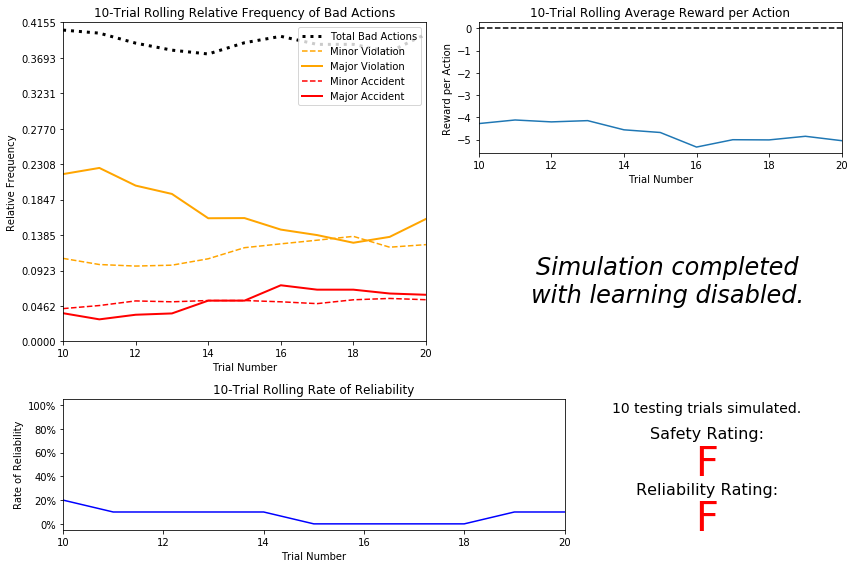

In [2]:
# Load the 'sim_no-learning' log file from the initial simulation results
vs.plot_trials('sim_no-learning.csv')

### Question 3
Using the visualization above that was produced from your initial simulation, provide an analysis and make several observations about the driving agent. Be sure that you are making at least one observation about each panel present in the visualization. Some things you could consider:
- *How frequently is the driving agent making bad decisions? How many of those bad decisions cause accidents?*
- *Given that the agent is driving randomly, does the rate of reliability make sense?*
- *What kind of rewards is the agent receiving for its actions? Do the rewards suggest it has been penalized heavily?*
- *As the number of trials increases, does the outcome of results change significantly?*
- *Would this Smartcab be considered safe and/or reliable for its passengers? Why or why not?*

**Answer:**
* As expected the agent doesn't do a very good job at safely and reliably reaching its destination. About 40% of its actions are considered "bad" (i.e. violating traffic rules with more than 10% of all actions causing accidents). Thus, the safety rating is the worst possible, and uderstandably so. No passenger would want to drive a autonomous cab that violates traffic rules in ~30% of all situation where it has to make a decision and even worse causes accidents at a worrying rate. Given that in real traffic the driver must constantly make decisions, a 10% accident rate would lead to almost certain crashes even for very short rides.
* On a similar note, the agent does only rarely reach its destination in time (less than 20% of all trials). Again, given the fact that it randomly decides which action to take and considering the size of the grid (8x6) this is hardly surprising granted that both the agent car and the destination to be reached are placed randomly on the grid.
* The agent gets rewarded based on making progress towards the goal and taking actions which are in compliance with traffic rules. Similarly, it receives negative rewards for disobeying traffic rules and not making progress towards the destination. The negative reward per action of between -4 and -5 indicates that the agent gets punished for major bad actions frequently.
* All of these results (frequency of bad actions, rate of reliability, reward per action) do not change significantly as the number of trials increases. This behavior is entirely as expected as the agent just chooses actions at random with no accumulation of knowledge with increasing trial number.
* In conclusion, an agent taking actions at random would be expected to score very low on both, reliability and safety, and would certainly not be considered sophisticated enough to be exposed to real customers as explained above.

-----
## Inform the Driving Agent
The second step to creating an optimized Q-learning driving agent is defining a set of states that the agent can occupy in the environment. Depending on the input, sensory data, and additional variables available to the driving agent, a set of states can be defined for the agent so that it can eventually *learn* what action it should take when occupying a state. The condition of `'if state then action'` for each state is called a **policy**, and is ultimately what the driving agent is expected to learn. Without defining states, the driving agent would never understand which action is most optimal -- or even what environmental variables and conditions it cares about!

### Identify States
Inspecting the `'build_state()'` agent function shows that the driving agent is given the following data from the environment:
- `'waypoint'`, which is the direction the *Smartcab* should drive leading to the destination, relative to the *Smartcab*'s heading.
- `'inputs'`, which is the sensor data from the *Smartcab*. It includes 
  - `'light'`, the color of the light.
  - `'left'`, the intended direction of travel for a vehicle to the *Smartcab*'s left. Returns `None` if no vehicle is present.
  - `'right'`, the intended direction of travel for a vehicle to the *Smartcab*'s right. Returns `None` if no vehicle is present.
  - `'oncoming'`, the intended direction of travel for a vehicle across the intersection from the *Smartcab*. Returns `None` if no vehicle is present.
- `'deadline'`, which is the number of actions remaining for the *Smartcab* to reach the destination before running out of time.

### Question 4
*Which features available to the agent are most relevant for learning both **safety** and **efficiency**? Why are these features appropriate for modeling the *Smartcab* in the environment? If you did not choose some features, why are those features* not *appropriate? Please note that whatever features you eventually choose for your agent's state, must be argued for here. That is: your code in agent.py should reflect the features chosen in this answer.
*

NOTE: You are not allowed to engineer new features for the smartcab. 

**Answer:**
* Safety: All sensor data. The agent needs to know which color the the light in front of it has and where other traffic is heading to adjust its behavior accordingly and avoid accidents. I would argue that all of these features are critical for the agent to successfully learn a policy in accordance with traffic laws.
* Efficiency: Waypoint and potentially deadline. Without knowing the next waypoint, the agent has no way of knowing which action would bring it towards its destination most efficiently in every state. As it receives positive reward for choosing actions that help it make progress towards its goal, it should be able to learn that following the waypoint (if traffic allows) is generally the best action to take in each state. Thus, it should be possible to achieve high efficiency without explicitly giving the agent the deadline in every state. In theory however, the deadline could be a relevant information with regards to efficiency.

### Define a State Space
When defining a set of states that the agent can occupy, it is necessary to consider the *size* of the state space. That is to say, if you expect the driving agent to learn a **policy** for each state, you would need to have an optimal action for *every* state the agent can occupy. If the number of all possible states is very large, it might be the case that the driving agent never learns what to do in some states, which can lead to uninformed decisions. For example, consider a case where the following features are used to define the state of the *Smartcab*:

`('is_raining', 'is_foggy', 'is_red_light', 'turn_left', 'no_traffic', 'previous_turn_left', 'time_of_day')`.

How frequently would the agent occupy a state like `(False, True, True, True, False, False, '3AM')`? Without a near-infinite amount of time for training, it's doubtful the agent would ever learn the proper action!

### Question 5
*If a state is defined using the features you've selected from **Question 4**, what would be the size of the state space? Given what you know about the environment and how it is simulated, do you think the driving agent could learn a policy for each possible state within a reasonable number of training trials?*  
**Hint:** Consider the *combinations* of features to calculate the total number of states!

**Answer:**
* From what I argued above, the essential features are:
    * inputs["light"]: green or red (2 states)
    * inputs["left"]: right, left, forward, none (4 states)
    * inputs["right"]: right, left, forward, none (4 states)
    * inputs["oncoming"]: right, left, forward, none (4 states)
    * waypoint: right, left or forward (3 states)
* This makes for a total of 384 different states
* Considering that in each trial something between 1 and 20 states are visited, this is already quite a large state space to learn an effective policy covering all of them (if we assume 15 states per trial due to a large number of failures in the earlier trials, I feel like it is unlikely that all states would be visited even in several hundred trials - I didn't calculate anything here and my feeling for probabilities was never that great ;-)). However, as I have argued above, I think that all of these features are vital information for the agent to even have a chance to learn a near-optimal policy.
* To conclude, it doesn't seem useful to integrate deadline as well, as it would increase the state space approximately 20-fold and I'll go with 
`state = (("next_waypoint", waypoint), ("light", inputs["light"]), ("oncoming", inputs["oncoming"]), ("left", inputs["left"]), ("right", inputs["right"]))`

### Update the Driving Agent State
For your second implementation, navigate to the `'build_state()'` agent function. With the justification you've provided in **Question 4**, you will now set the `'state'` variable to a tuple of all the features necessary for Q-Learning. Confirm your driving agent is updating its state by running the agent file and simulation briefly and note whether the state is displaying. If the visual simulation is used, confirm that the updated state corresponds with what is seen in the simulation.

**Note:** Remember to reset simulation flags to their default setting when making this observation!

-----
## Implement a Q-Learning Driving Agent
The third step to creating an optimized Q-Learning agent is to begin implementing the functionality of Q-Learning itself. The concept of Q-Learning is fairly straightforward: For every state the agent visits, create an entry in the Q-table for all state-action pairs available. Then, when the agent encounters a state and performs an action, update the Q-value associated with that state-action pair based on the reward received and the iterative update rule implemented. Of course, additional benefits come from Q-Learning, such that we can have the agent choose the *best* action for each state based on the Q-values of each state-action pair possible. For this project, you will be implementing a *decaying,* $\epsilon$*-greedy* Q-learning algorithm with *no* discount factor. Follow the implementation instructions under each **TODO** in the agent functions.

Note that the agent attribute `self.Q` is a dictionary: This is how the Q-table will be formed. Each state will be a key of the `self.Q` dictionary, and each value will then be another dictionary that holds the *action* and *Q-value*. Here is an example:

```
{ 'state-1': { 
    'action-1' : Qvalue-1,
    'action-2' : Qvalue-2,
     ...
   },
  'state-2': {
    'action-1' : Qvalue-1,
     ...
   },
   ...
}
```

Furthermore, note that you are expected to use a *decaying* $\epsilon$ *(exploration) factor*. Hence, as the number of trials increases, $\epsilon$ should decrease towards 0. This is because the agent is expected to learn from its behavior and begin acting on its learned behavior. Additionally, The agent will be tested on what it has learned after $\epsilon$ has passed a certain threshold (the default threshold is 0.05). For the initial Q-Learning implementation, you will be implementing a linear decaying function for $\epsilon$.

### Q-Learning Simulation Results
To obtain results from the initial Q-Learning implementation, you will need to adjust the following flags and setup:
- `'enforce_deadline'` - Set this to `True` to force the driving agent to capture whether it reaches the destination in time.
- `'update_delay'` - Set this to a small value (such as `0.01`) to reduce the time between steps in each trial.
- `'log_metrics'` - Set this to `True` to log the simluation results as a `.csv` file and the Q-table as a `.txt` file in `/logs/`.
- `'n_test'` - Set this to `'10'` to perform 10 testing trials.
- `'learning'` - Set this to `'True'` to tell the driving agent to use your Q-Learning implementation.

In addition, use the following decay function for $\epsilon$:

$$ \epsilon_{t+1} = \epsilon_{t} - 0.05, \hspace{10px}\textrm{for trial number } t$$

If you have difficulty getting your implementation to work, try setting the `'verbose'` flag to `True` to help debug. Flags that have been set here should be returned to their default setting when debugging. It is important that you understand what each flag does and how it affects the simulation! 

Once you have successfully completed the initial Q-Learning simulation, run the code cell below to visualize the results. Note that log files are overwritten when identical simulations are run, so be careful with what log file is being loaded!

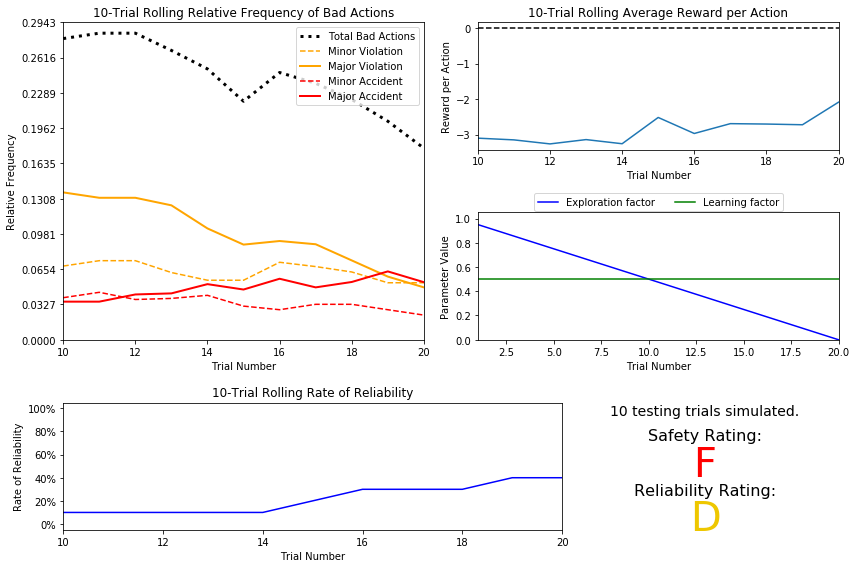

In [3]:
# Load the 'sim_default-learning' file from the default Q-Learning simulation
vs.plot_trials('sim_default-learning.csv')

### Question 6
Using the visualization above that was produced from your default Q-Learning simulation, provide an analysis and make observations about the driving agent like in **Question 3**. Note that the simulation should have also produced the Q-table in a text file which can help you make observations about the agent's learning. Some additional things you could consider:  
- *Are there any observations that are similar between the basic driving agent and the default Q-Learning agent?*
- *Approximately how many training trials did the driving agent require before testing? Does that number make sense given the epsilon-tolerance?*
- *Is the decaying function you implemented for $\epsilon$ (the exploration factor) accurately represented in the parameters panel?*
- *As the number of training trials increased, did the number of bad actions decrease? Did the average reward increase?*
- *How does the safety and reliability rating compare to the initial driving agent?*

**Answer:**
* Similarly to the basic driving agent, the default q-learning agent can be considered neither safe nor reliable (granted that the reliability rating is a little less bad for the ten testing trials), at least not after 20 training trials. This number of trials makes sense given that epsilon is decreased by a constant 0.05 (from 1.0) with each trial and the epsilon tolerance threshold is 0.05. 
* The chosen parameters (alpha set to default at 0.5 and epsilon decaying linearly) are correctly displayed in the panel.
* Luckily, a positive trend can be observed for all important metrics (number of bad actions decreases, rate of reliability  and average reward per action increase), which shows that some learning is happening

-----
## Improve the Q-Learning Driving Agent
The third step to creating an optimized Q-Learning agent is to perform the optimization! Now that the Q-Learning algorithm is implemented and the driving agent is successfully learning, it's necessary to tune settings and adjust learning paramaters so the driving agent learns both **safety** and **efficiency**. Typically this step will require a lot of trial and error, as some settings will invariably make the learning worse. One thing to keep in mind is the act of learning itself and the time that this takes: In theory, we could allow the agent to learn for an incredibly long amount of time; however, another goal of Q-Learning is to *transition from experimenting with unlearned behavior to acting on learned behavior*. For example, always allowing the agent to perform a random action during training (if $\epsilon = 1$ and never decays) will certainly make it *learn*, but never let it *act*. When improving on your Q-Learning implementation, consider the implications it creates and whether it is logistically sensible to make a particular adjustment.

### Improved Q-Learning Simulation Results
To obtain results from the initial Q-Learning implementation, you will need to adjust the following flags and setup:
- `'enforce_deadline'` - Set this to `True` to force the driving agent to capture whether it reaches the destination in time.
- `'update_delay'` - Set this to a small value (such as `0.01`) to reduce the time between steps in each trial.
- `'log_metrics'` - Set this to `True` to log the simluation results as a `.csv` file and the Q-table as a `.txt` file in `/logs/`.
- `'learning'` - Set this to `'True'` to tell the driving agent to use your Q-Learning implementation.
- `'optimized'` - Set this to `'True'` to tell the driving agent you are performing an optimized version of the Q-Learning implementation.

Additional flags that can be adjusted as part of optimizing the Q-Learning agent:
- `'n_test'` - Set this to some positive number (previously 10) to perform that many testing trials.
- `'alpha'` - Set this to a real number between 0 - 1 to adjust the learning rate of the Q-Learning algorithm.
- `'epsilon'` - Set this to a real number between 0 - 1 to adjust the starting exploration factor of the Q-Learning algorithm.
- `'tolerance'` - set this to some small value larger than 0 (default was 0.05) to set the epsilon threshold for testing.

Furthermore, use a decaying function of your choice for $\epsilon$ (the exploration factor). Note that whichever function you use, it **must decay to **`'tolerance'`** at a reasonable rate**. The Q-Learning agent will not begin testing until this occurs. Some example decaying functions (for $t$, the number of trials):

$$ \epsilon = a^t, \textrm{for } 0 < a < 1 \hspace{50px}\epsilon = \frac{1}{t^2}\hspace{50px}\epsilon = e^{-at}, \textrm{for } 0 < a < 1 \hspace{50px} \epsilon = \cos(at), \textrm{for } 0 < a < 1$$
You may also use a decaying function for $\alpha$ (the learning rate) if you so choose, however this is typically less common. If you do so, be sure that it adheres to the inequality $0 \leq \alpha \leq 1$.

If you have difficulty getting your implementation to work, try setting the `'verbose'` flag to `True` to help debug. Flags that have been set here should be returned to their default setting when debugging. It is important that you understand what each flag does and how it affects the simulation! 

Once you have successfully completed the improved Q-Learning simulation, run the code cell below to visualize the results. Note that log files are overwritten when identical simulations are run, so be careful with what log file is being loaded!

In [4]:
import os
import glob

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_cosine_0.0025_alpha_constant_0.01.csv
#################################################################


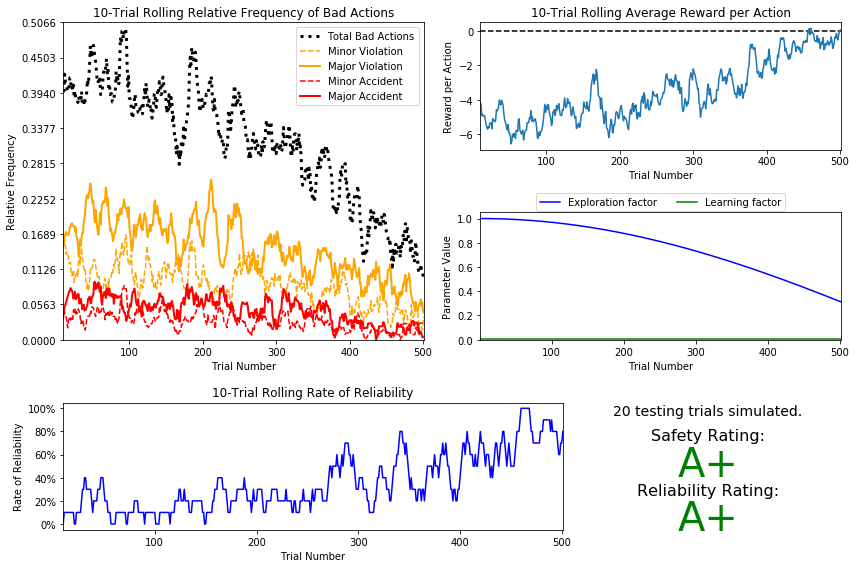

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_cosine_0.0025_alpha_constant_0.05.csv
#################################################################


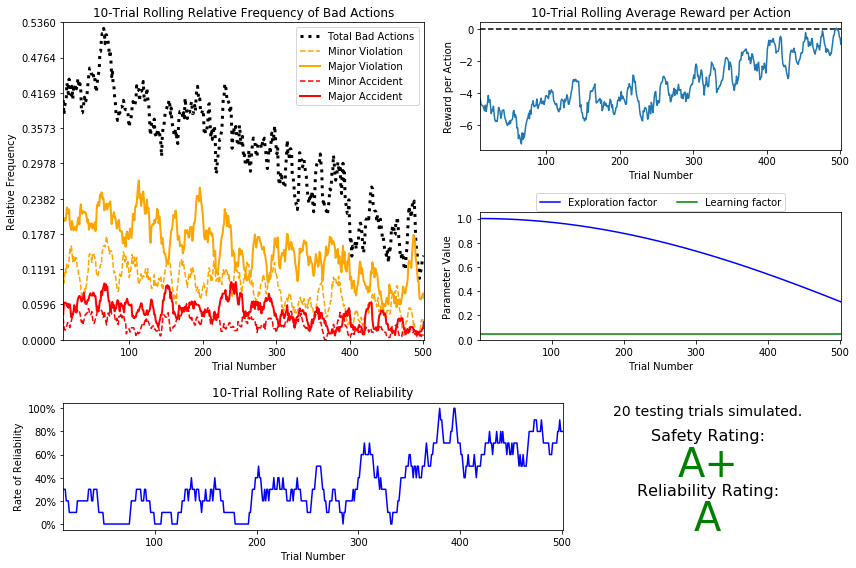

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_cosine_0.0025_alpha_constant_0.1.csv
#################################################################


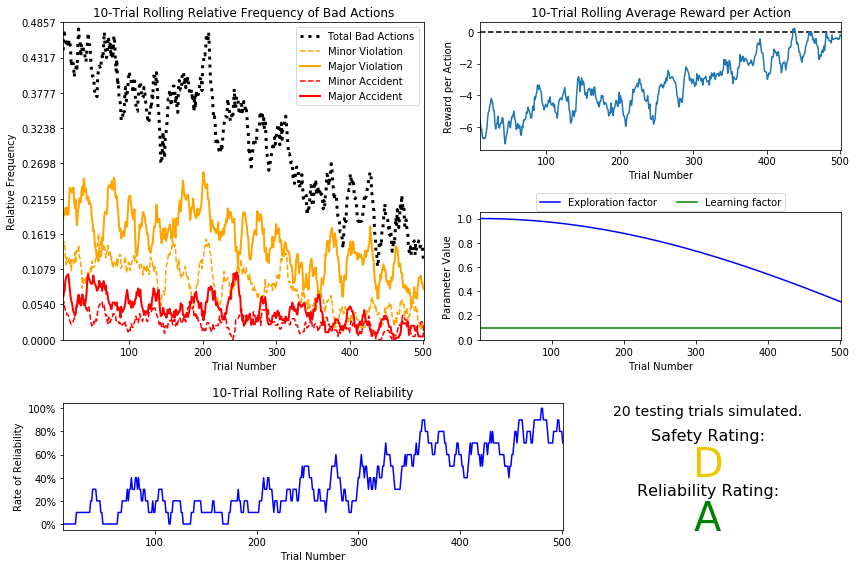

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_cosine_0.0025_alpha_constant_0.5.csv
#################################################################


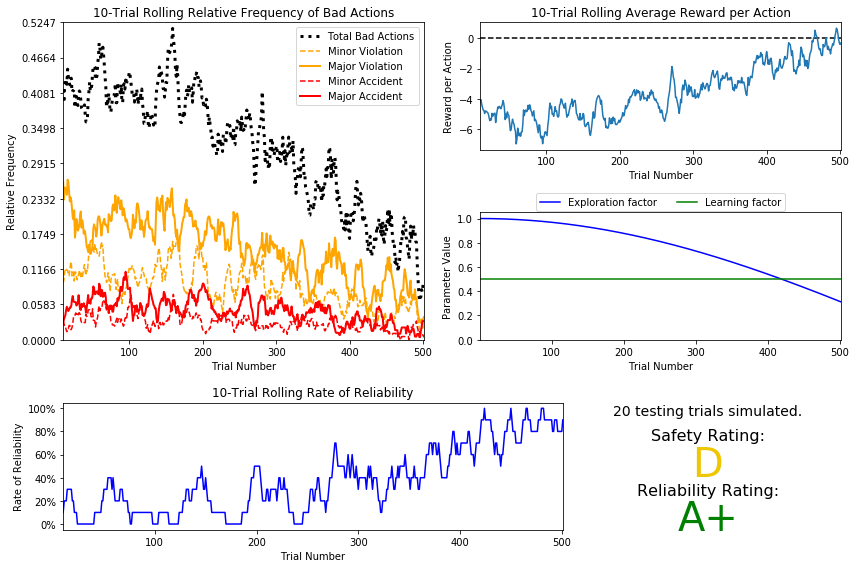

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_cosine_0.0025_alpha_exponential_-0.03_annealing_25.csv
#################################################################


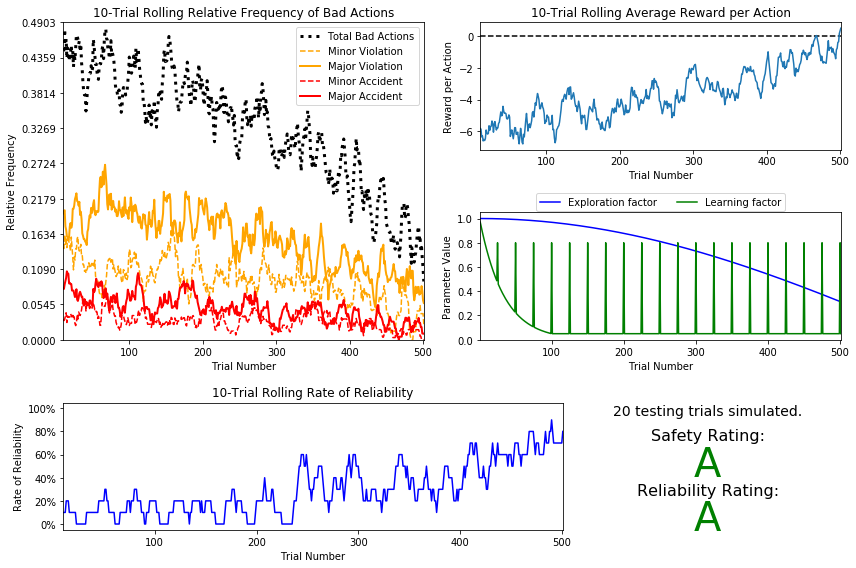

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_cosine_0.0025_alpha_exponential_-0.03_annealing_50.csv
#################################################################


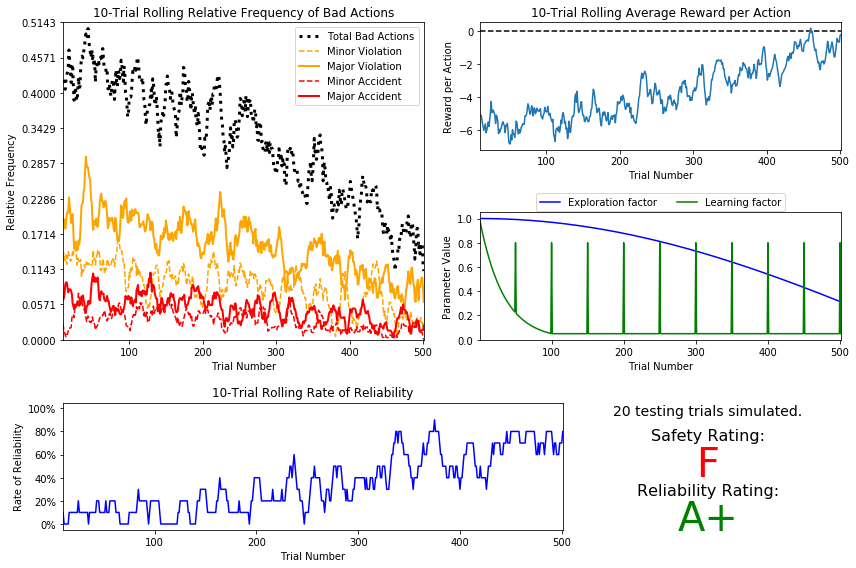

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_cosine_0.0025_alpha_exponential_-0.03_no_annealing.csv
#################################################################


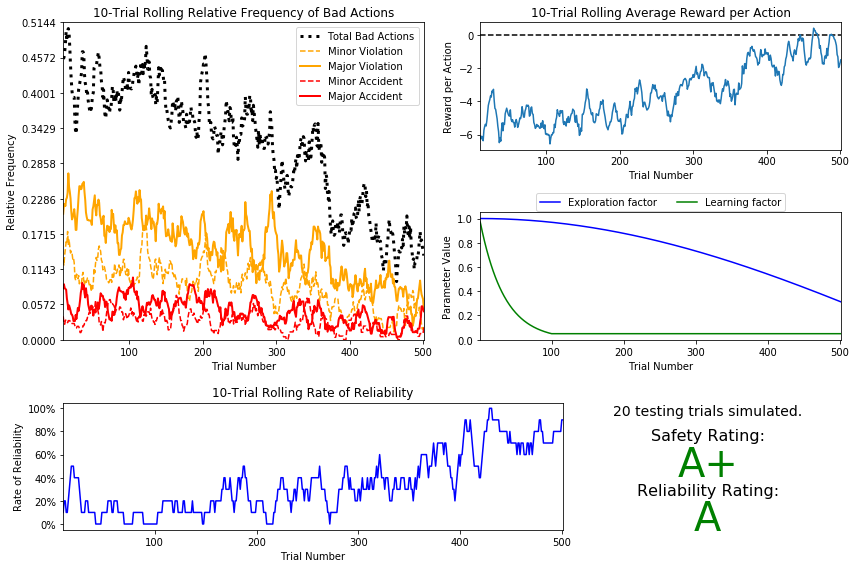

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.96_exp_n_trials_alpha_constant_0.01.csv
#################################################################


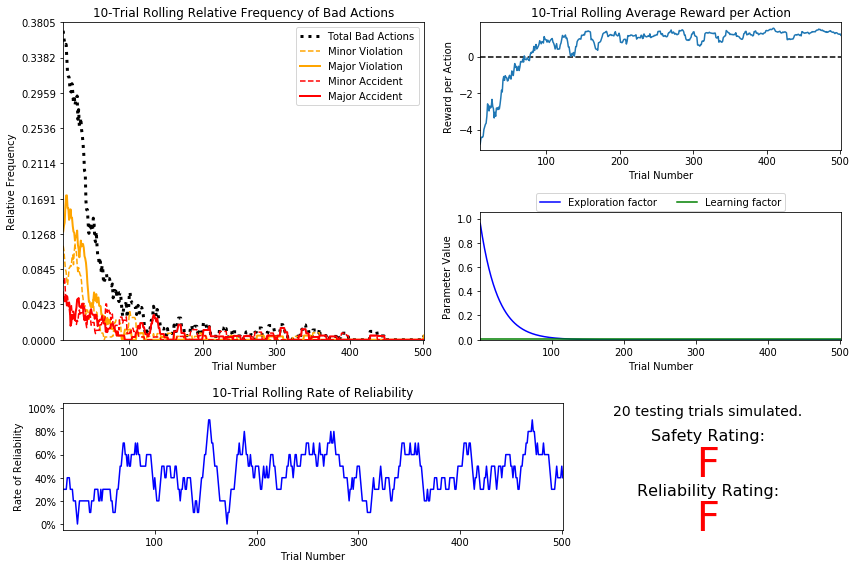

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.96_exp_n_trials_alpha_constant_0.05.csv
#################################################################


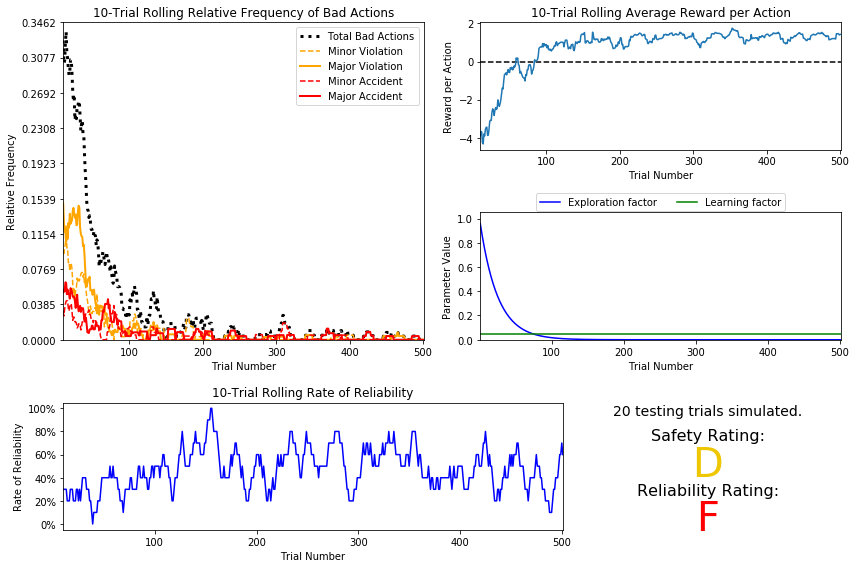

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.96_exp_n_trials_alpha_constant_0.1.csv
#################################################################


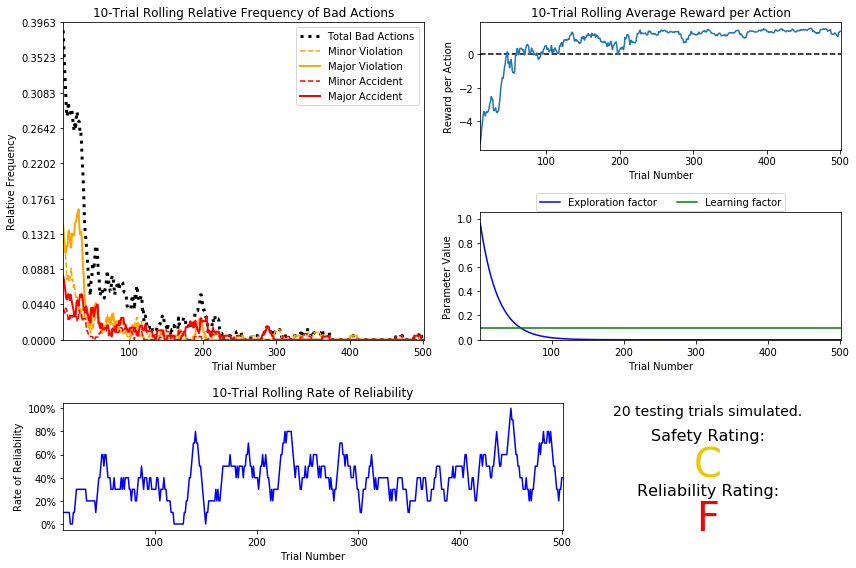

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.96_exp_n_trials_alpha_constant_0.5.csv
#################################################################


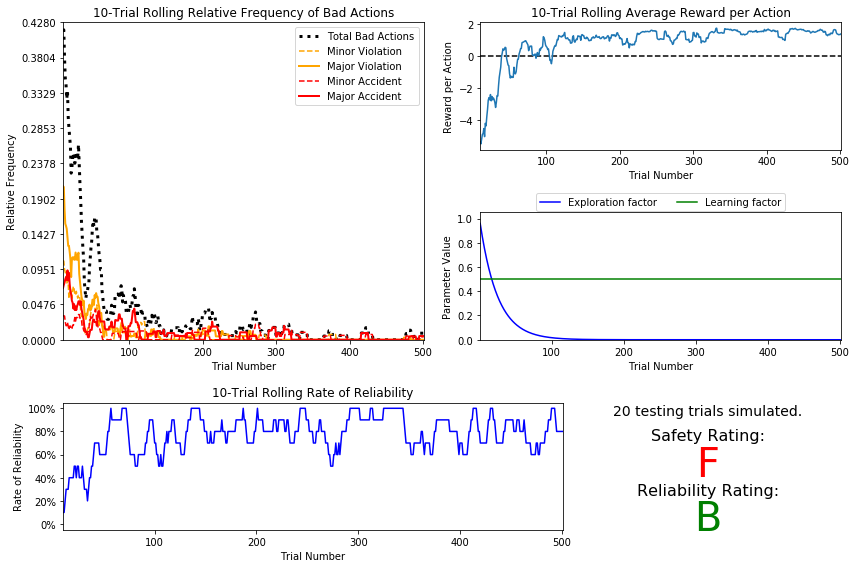

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.96_exp_n_trials_alpha_exponential_-0.03_annealing_25.csv
#################################################################


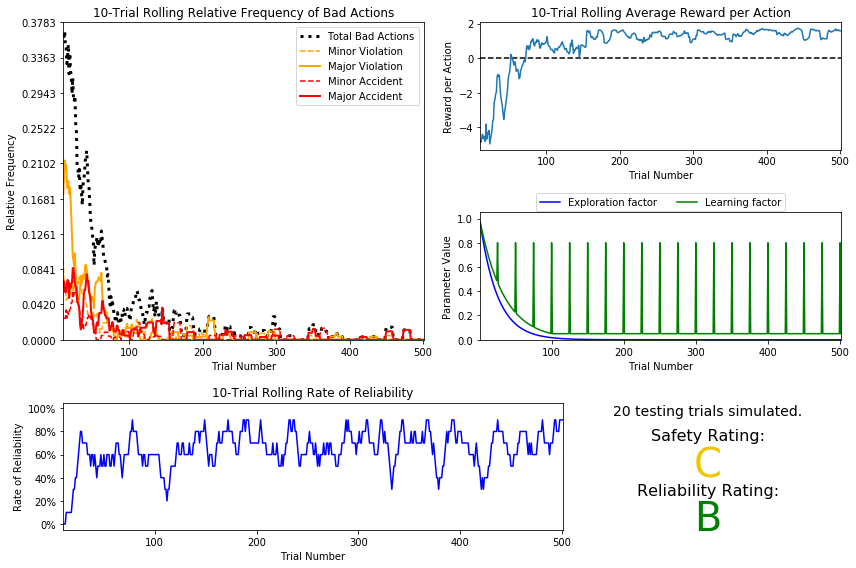

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.96_exp_n_trials_alpha_exponential_-0.03_annealing_50.csv
#################################################################


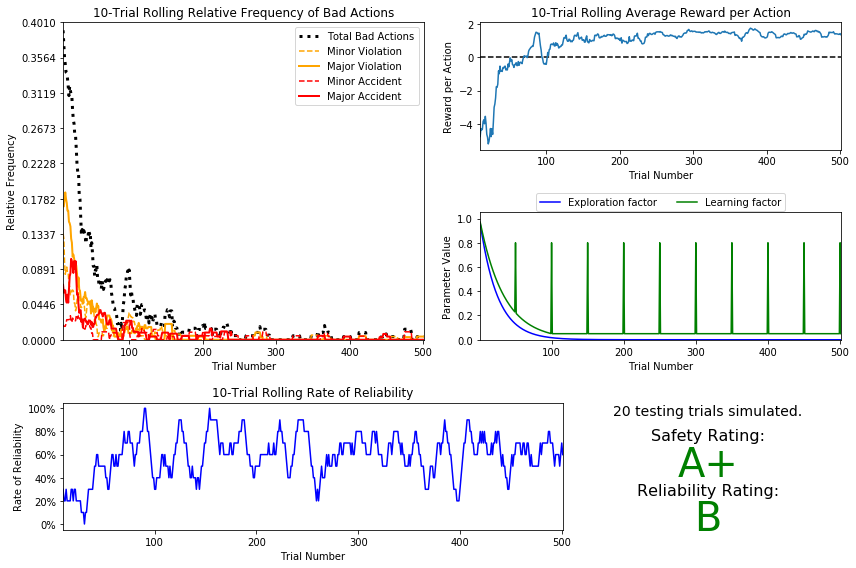

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.96_exp_n_trials_alpha_exponential_-0.03_no_annealing.csv
#################################################################


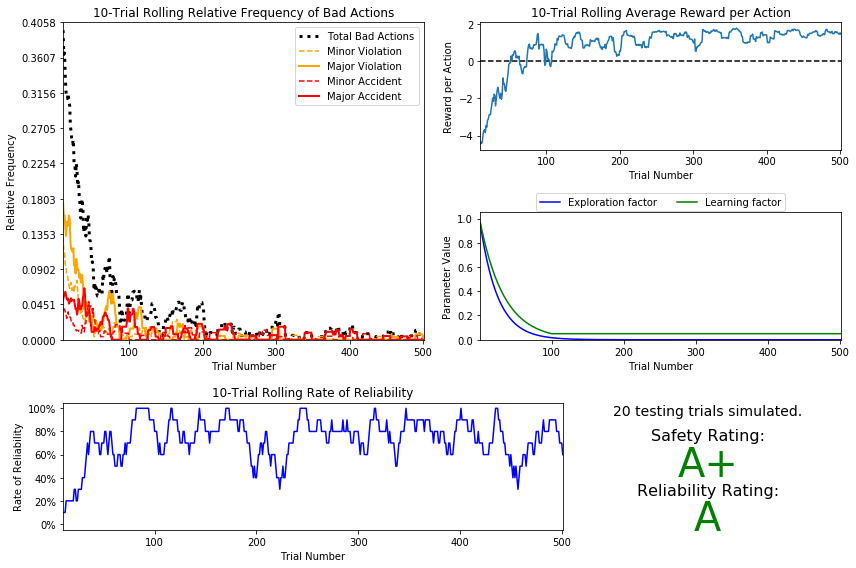

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.97_exp_n_trials_alpha_constant_0.01.csv
#################################################################


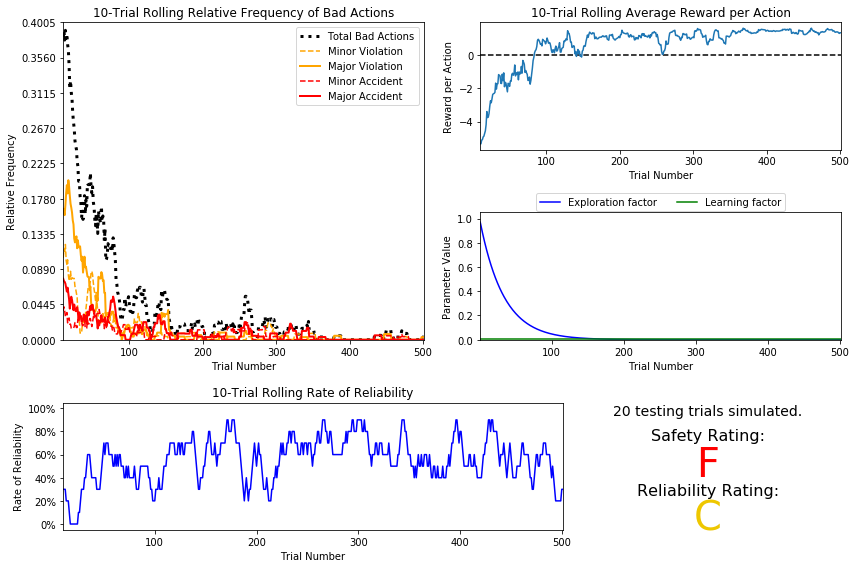

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.97_exp_n_trials_alpha_constant_0.05.csv
#################################################################


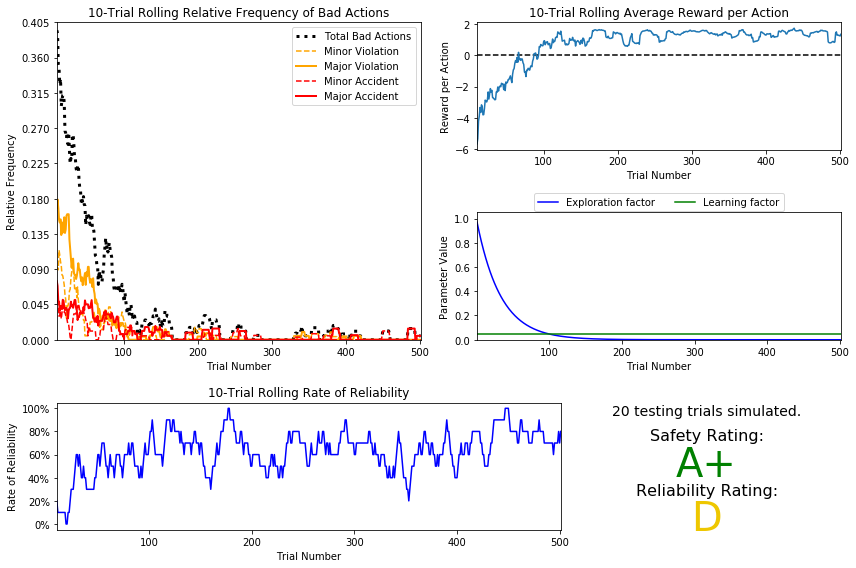

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.97_exp_n_trials_alpha_constant_0.1.csv
#################################################################


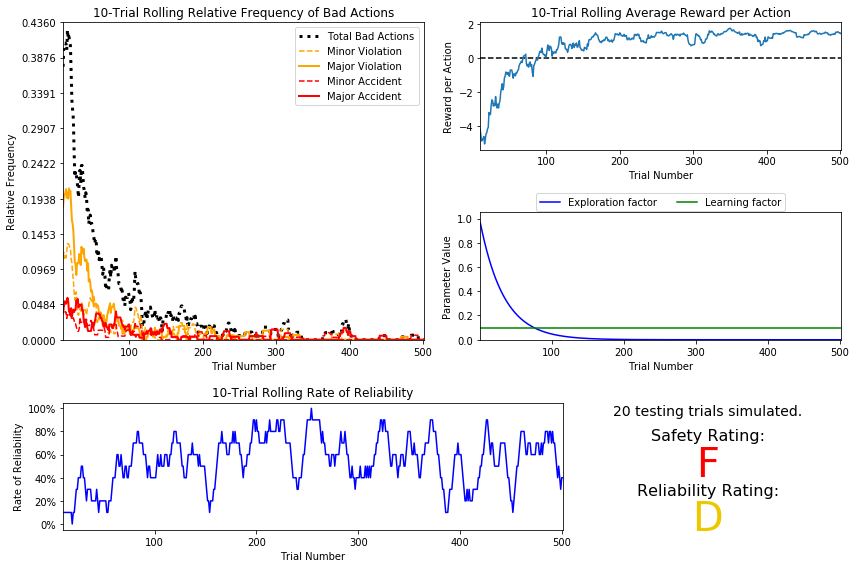

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.97_exp_n_trials_alpha_constant_0.5.csv
#################################################################


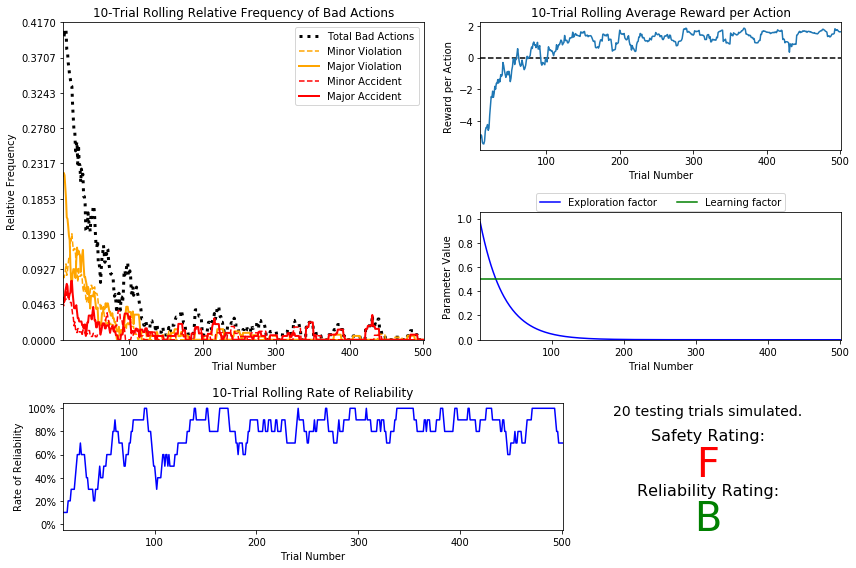

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.97_exp_n_trials_alpha_exponential_-0.03_annealing_25.csv
#################################################################


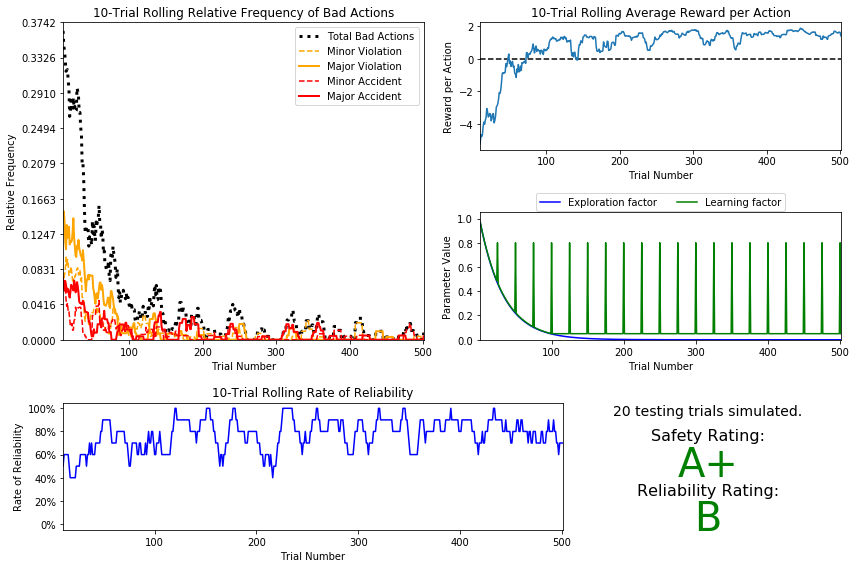

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.97_exp_n_trials_alpha_exponential_-0.03_annealing_50.csv
#################################################################


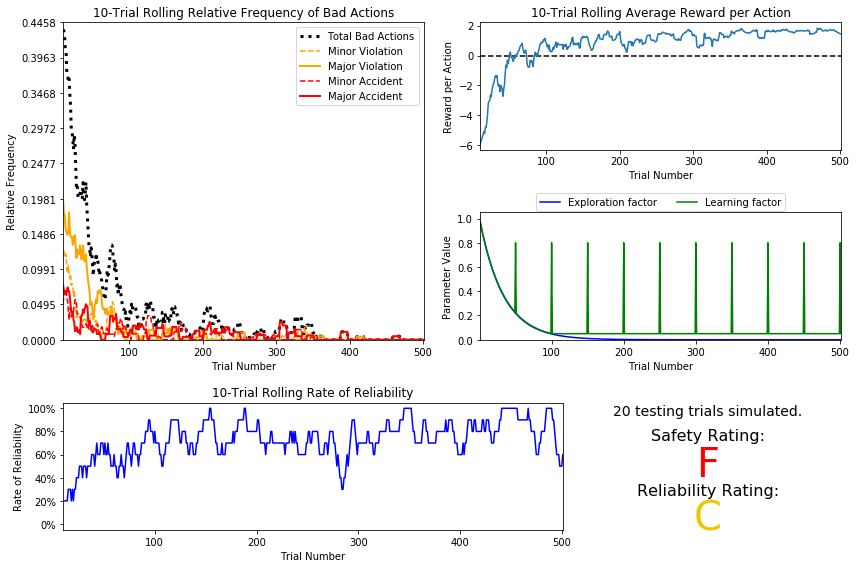

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.97_exp_n_trials_alpha_exponential_-0.03_no_annealing.csv
#################################################################


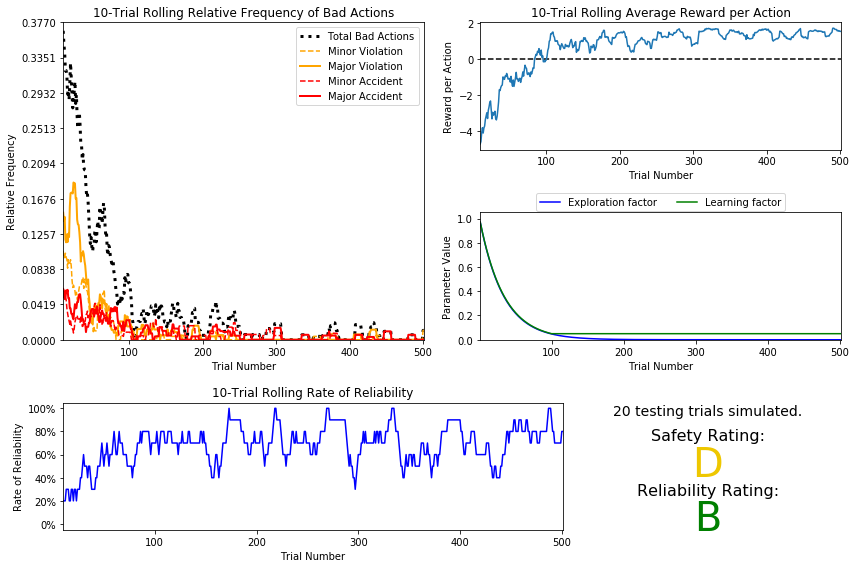

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.98_exp_n_trials_alpha_constant_0.01.csv
#################################################################


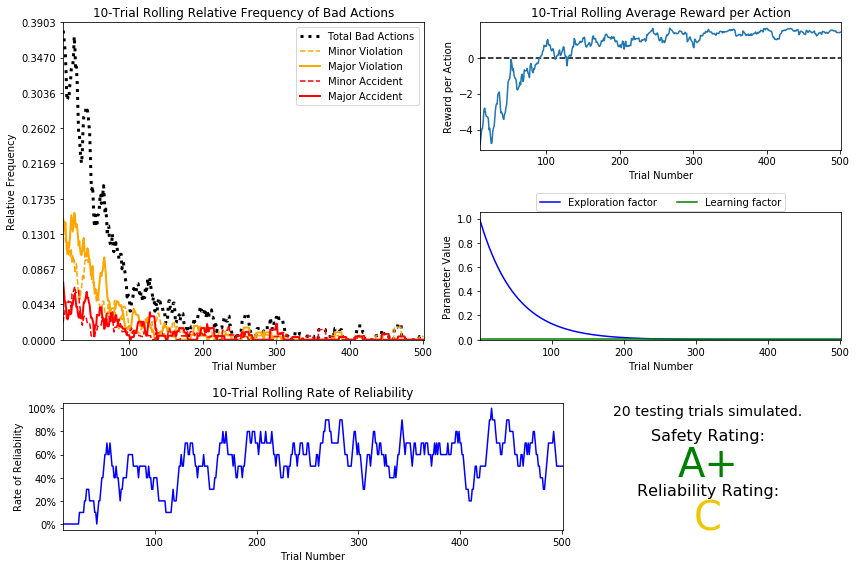

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.98_exp_n_trials_alpha_constant_0.05.csv
#################################################################


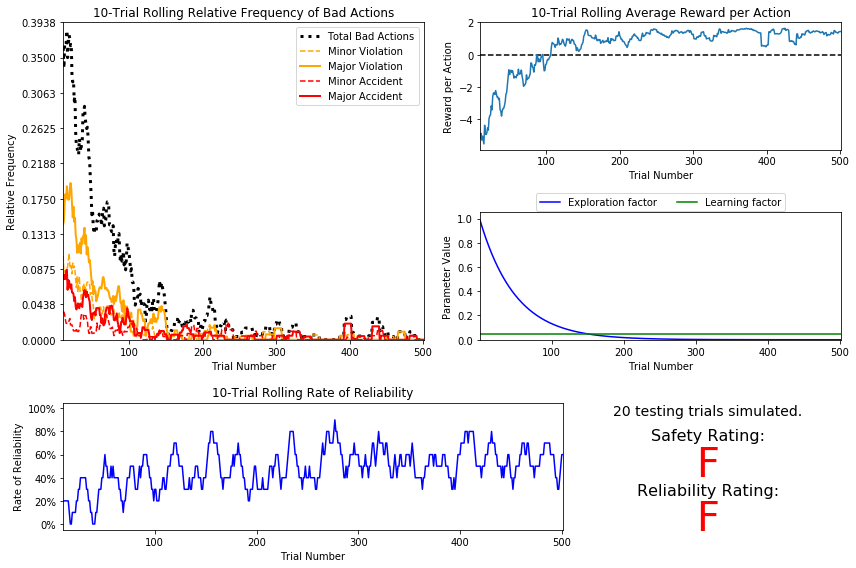

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.98_exp_n_trials_alpha_constant_0.1.csv
#################################################################


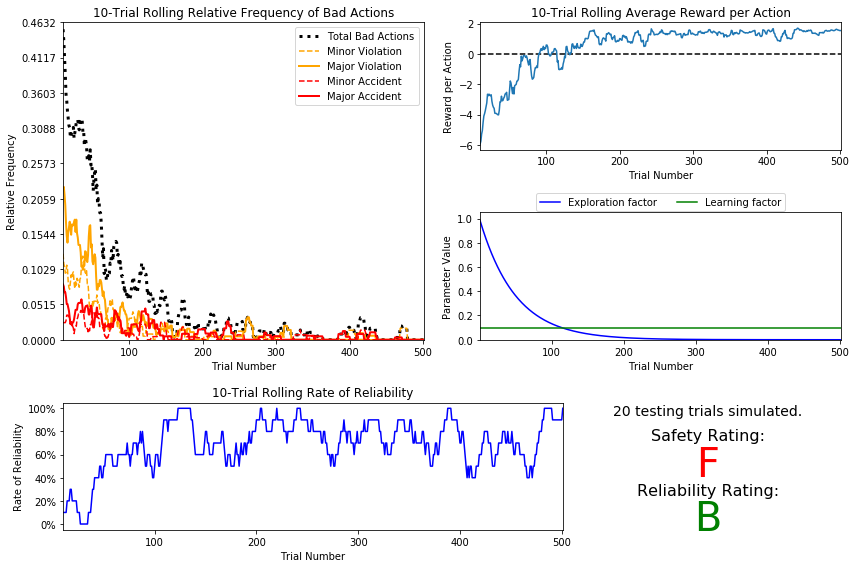

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.98_exp_n_trials_alpha_constant_0.5.csv
#################################################################


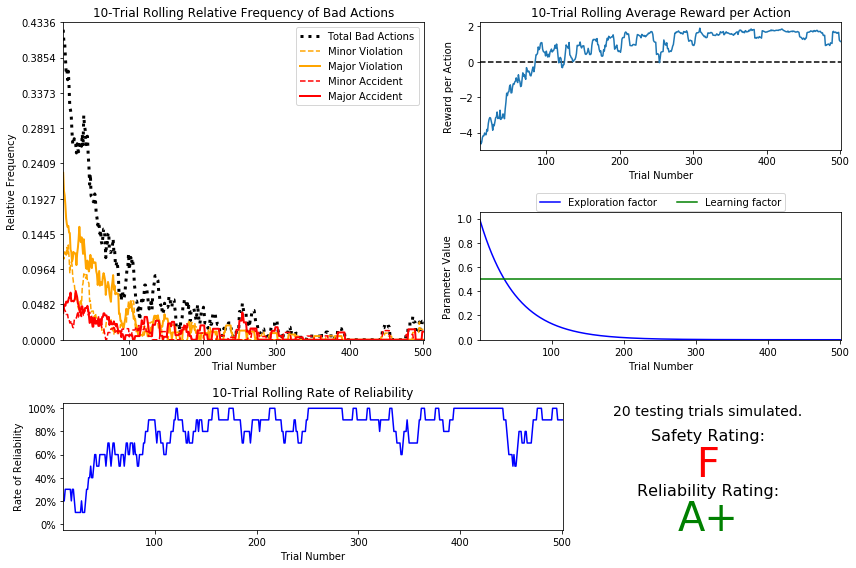

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.98_exp_n_trials_alpha_exponential_-0.03_annealing_25.csv
#################################################################


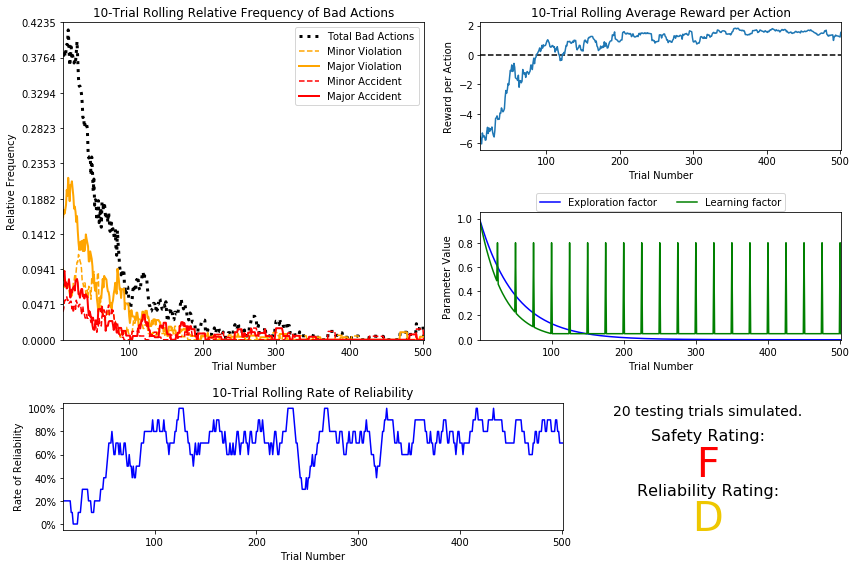

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.98_exp_n_trials_alpha_exponential_-0.03_annealing_50.csv
#################################################################


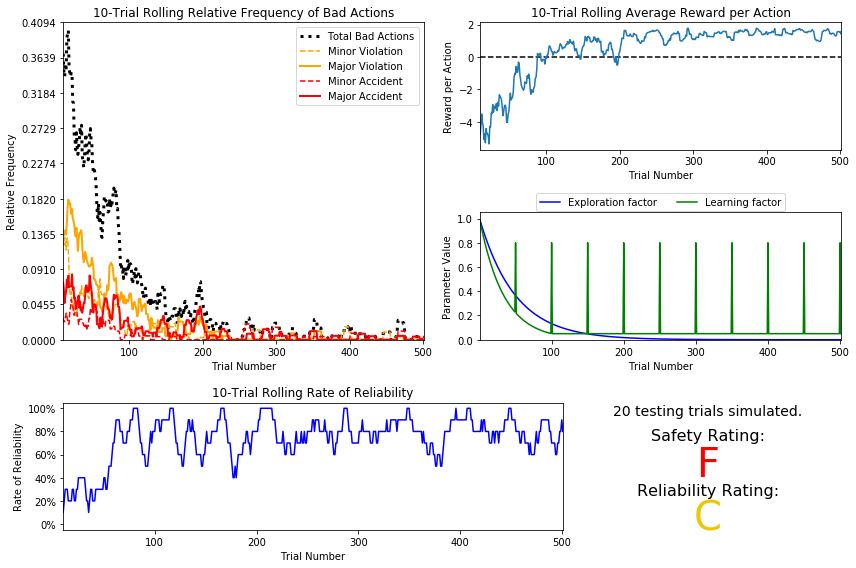

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_0.98_exp_n_trials_alpha_exponential_-0.03_no_annealing.csv
#################################################################


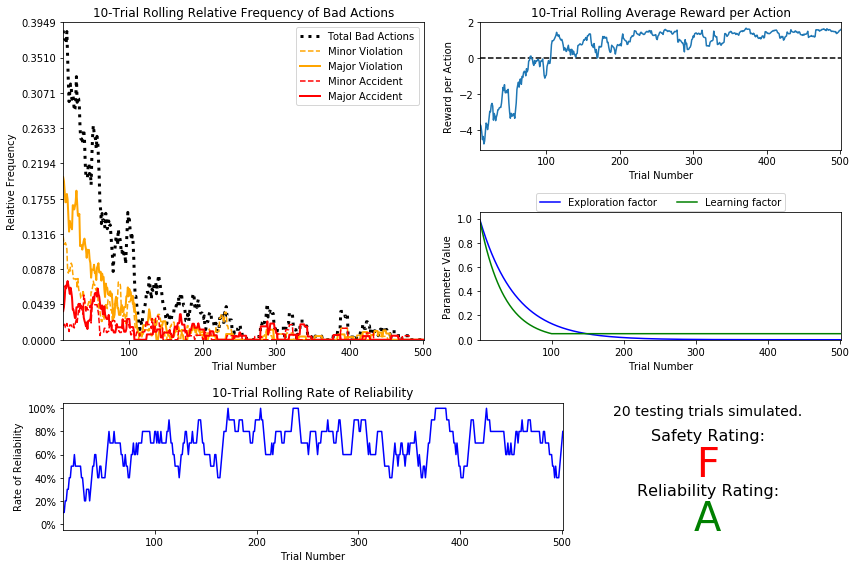

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_alpha_constant_0.01.csv
#################################################################


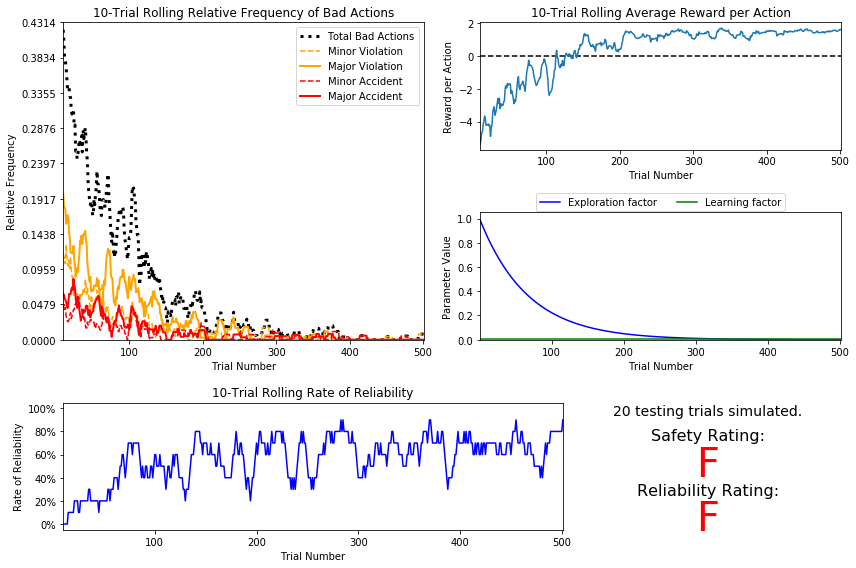

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_alpha_constant_0.05.csv
#################################################################


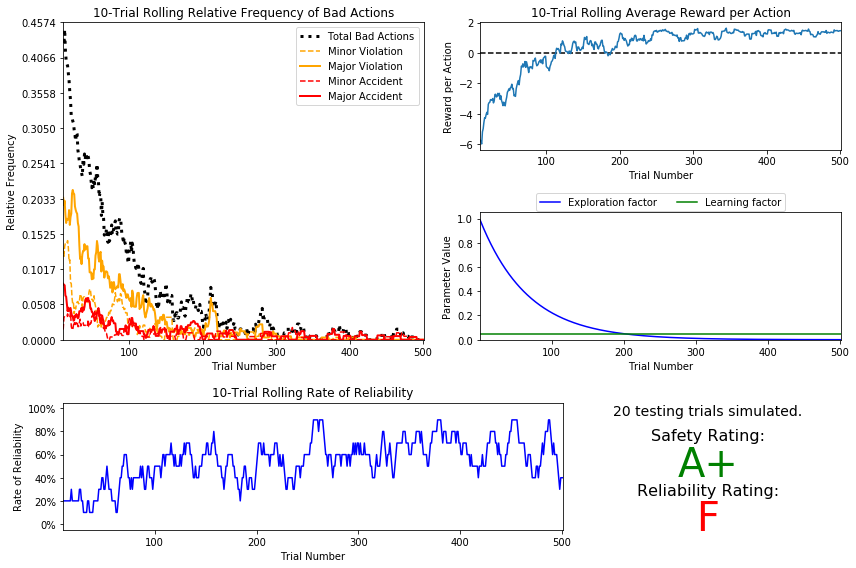

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_alpha_constant_0.1.csv
#################################################################


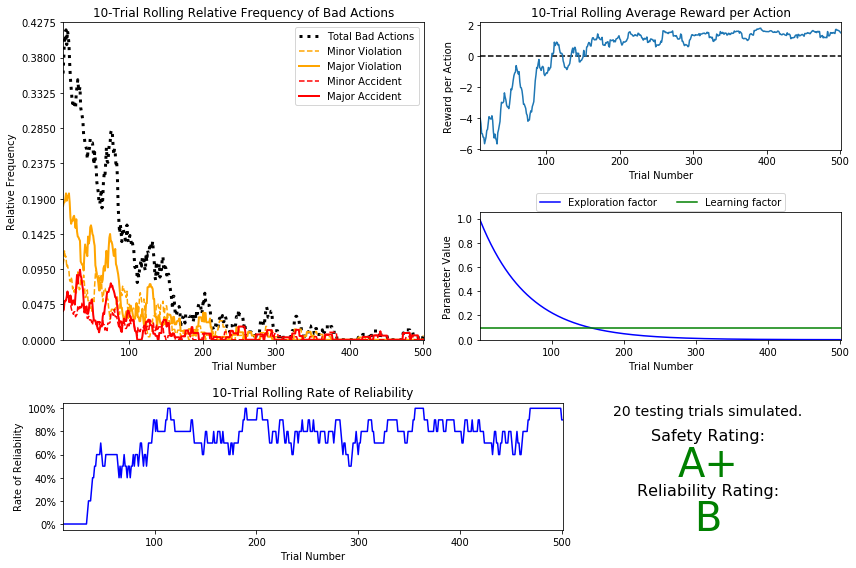

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_alpha_constant_0.5.csv
#################################################################


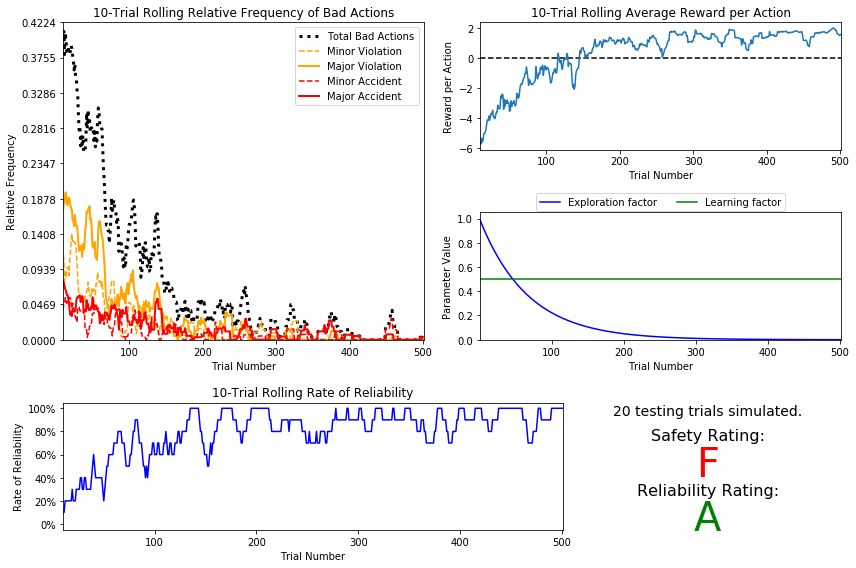

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_alpha_exponential_-0.03_annealing_25.csv
#################################################################


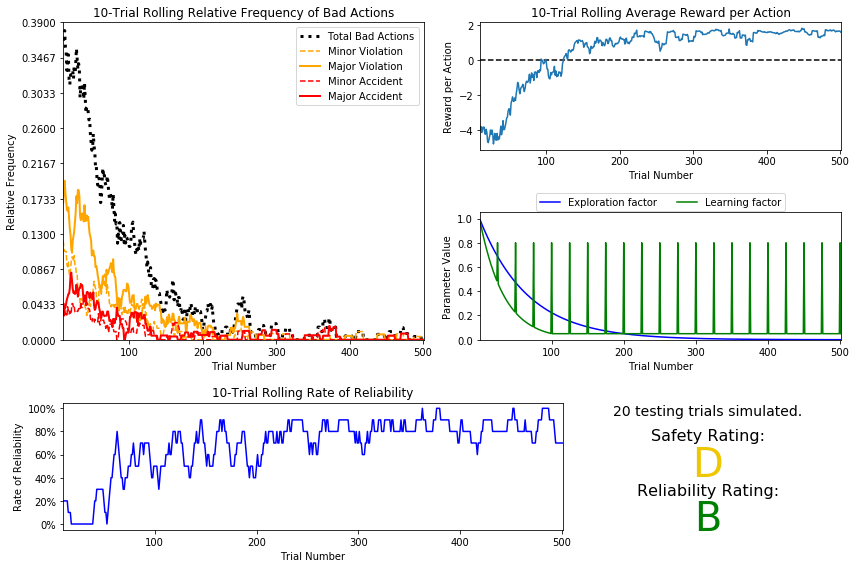

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_alpha_exponential_-0.03_annealing_50.csv
#################################################################


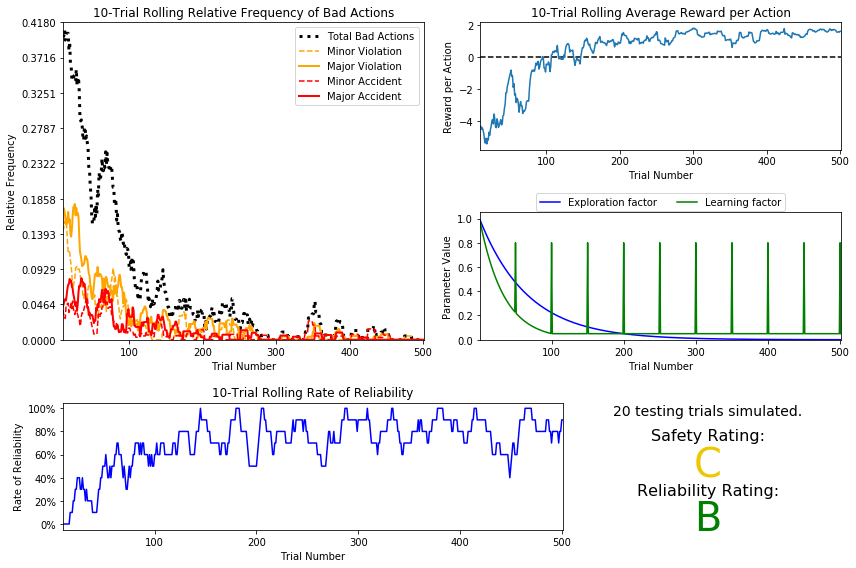

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_alpha_exponential_-0.03_no_annealing.csv
#################################################################


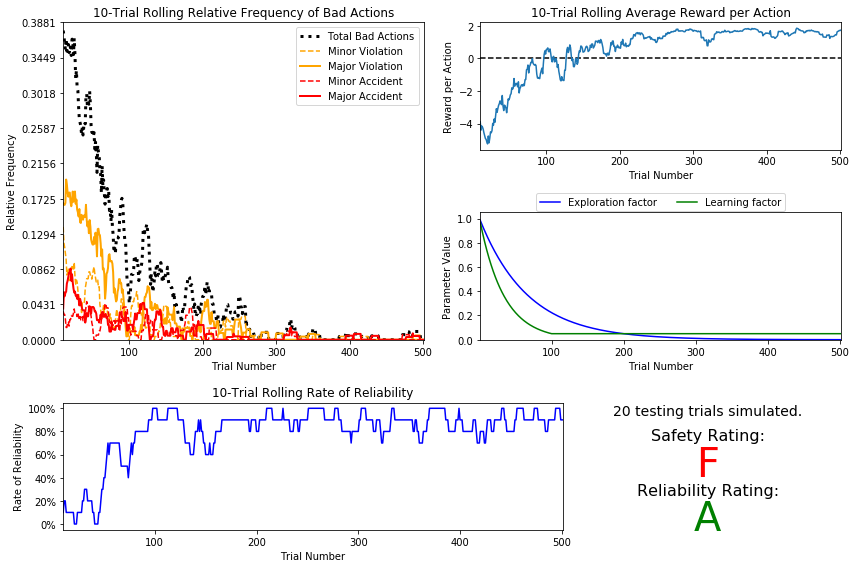

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_annealing_25_alpha_constant_0.01.csv
#################################################################


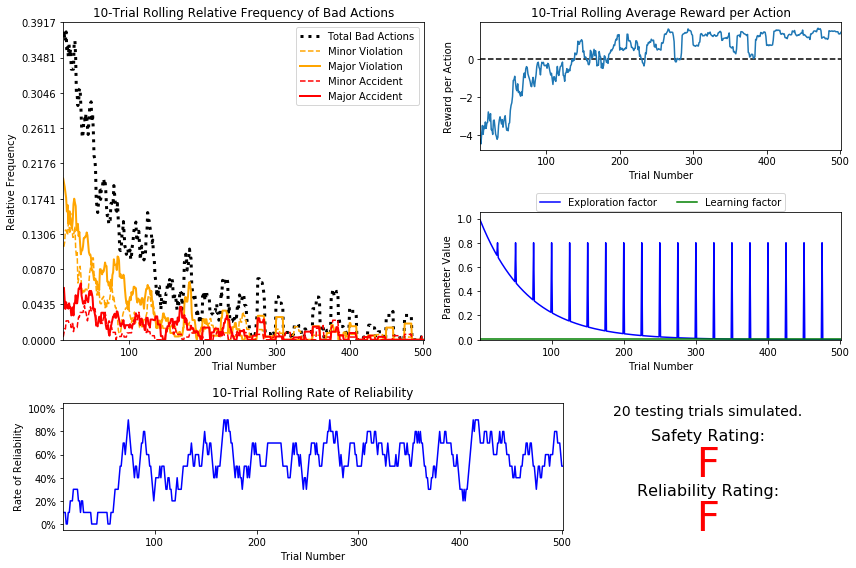

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_annealing_25_alpha_constant_0.05.csv
#################################################################


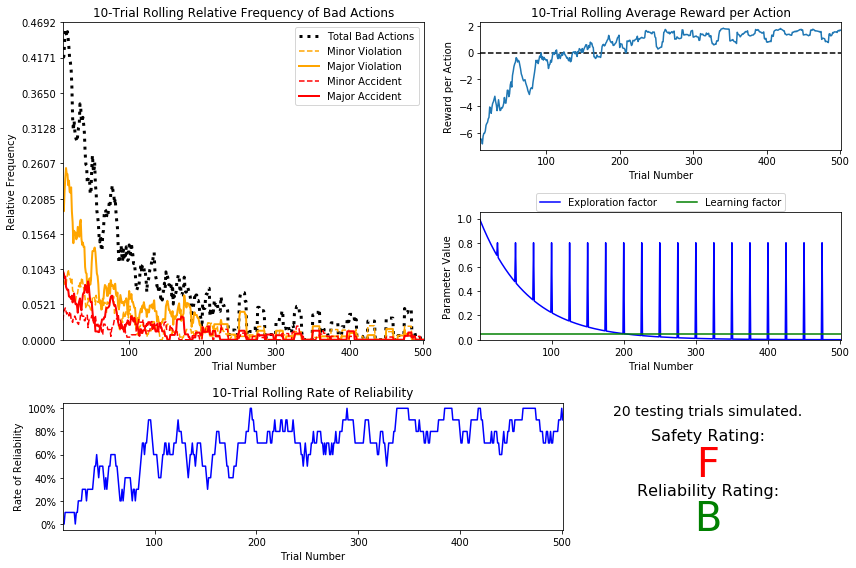

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_annealing_25_alpha_constant_0.1.csv
#################################################################


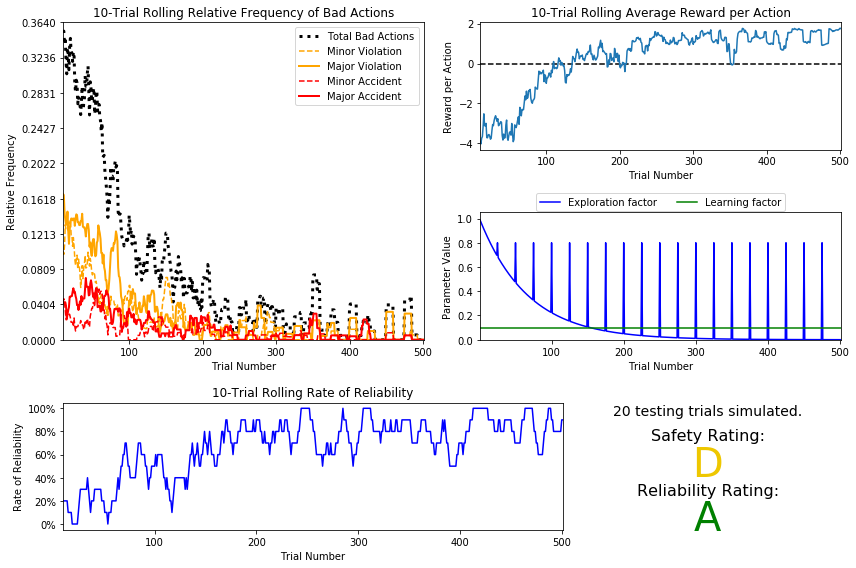

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_annealing_25_alpha_constant_0.5.csv
#################################################################


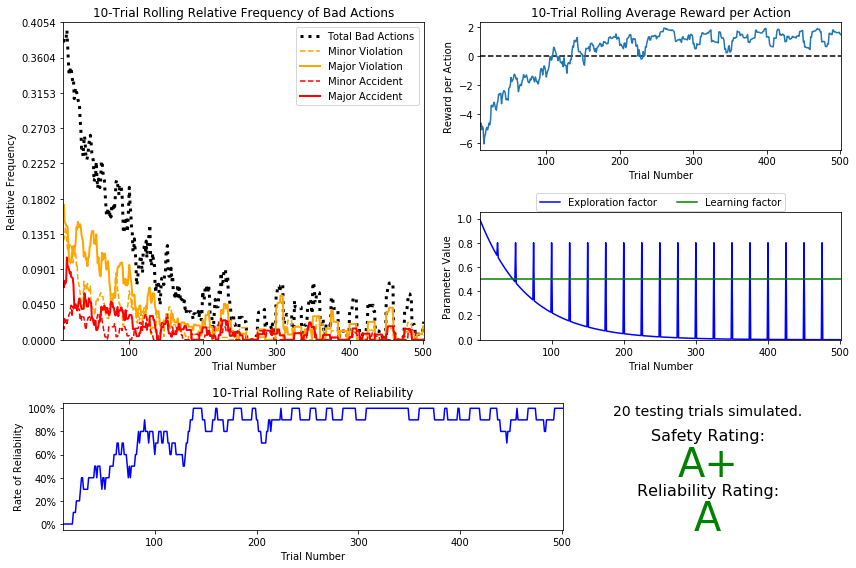

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_annealing_25_alpha_exponential_-0.03_annealing_25.csv
#################################################################


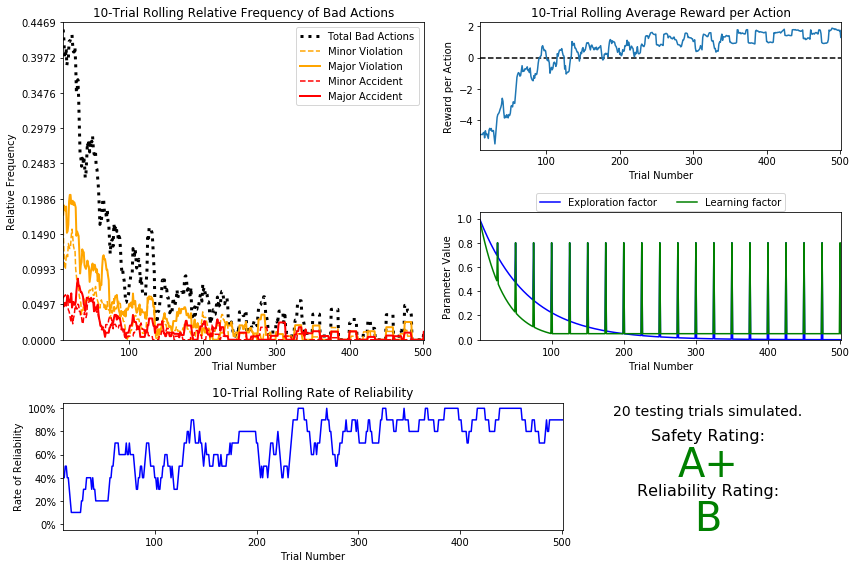

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_annealing_25_alpha_exponential_-0.03_annealing_50.csv
#################################################################


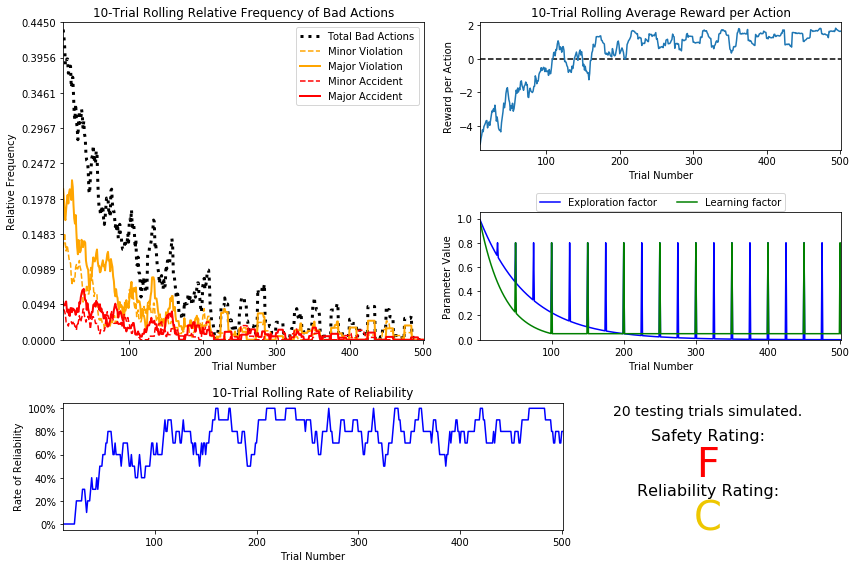

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.015_annealing_25_alpha_exponential_-0.03_no_annealing.csv
#################################################################


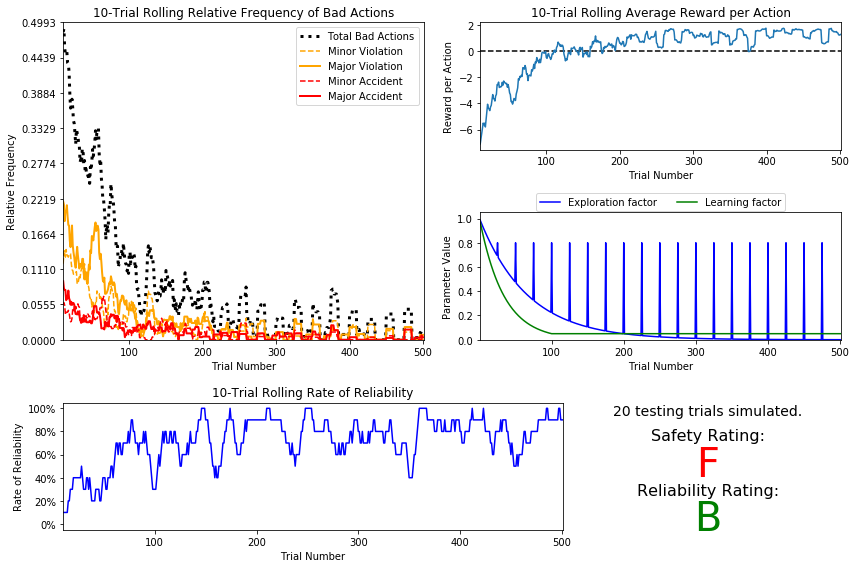

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_alpha_constant_0.01.csv
#################################################################


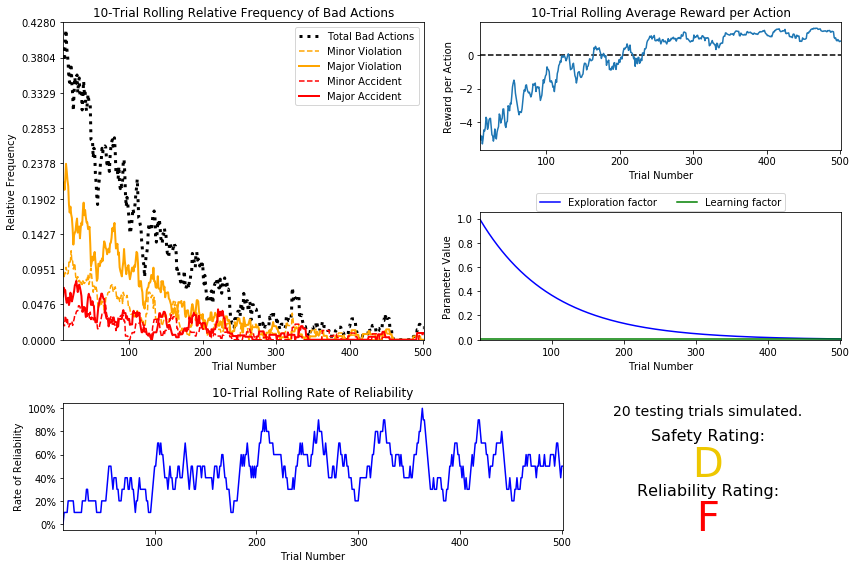

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_alpha_constant_0.05.csv
#################################################################


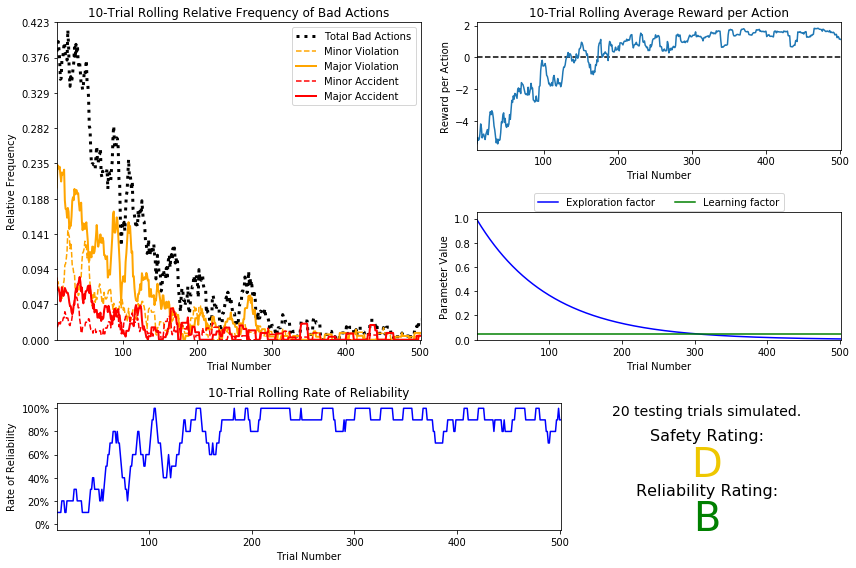

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_alpha_constant_0.1.csv
#################################################################


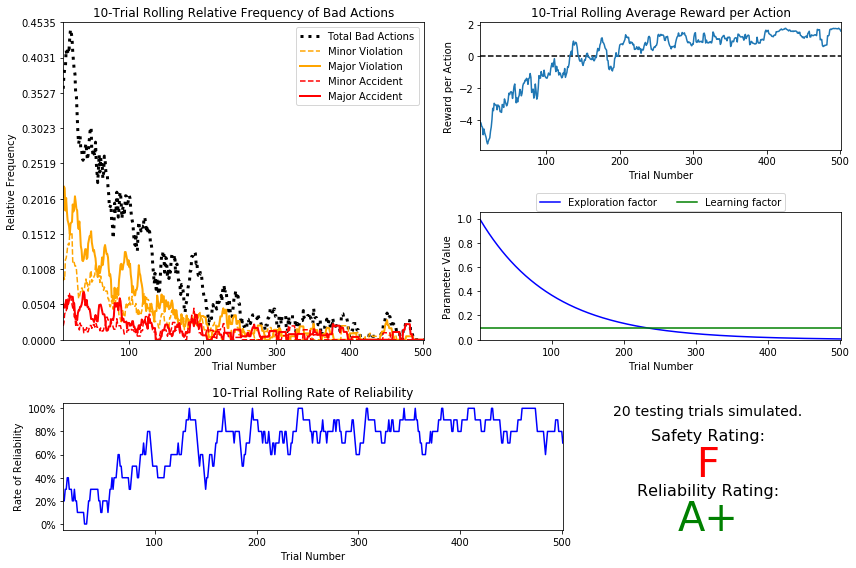

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_alpha_constant_0.5.csv
#################################################################


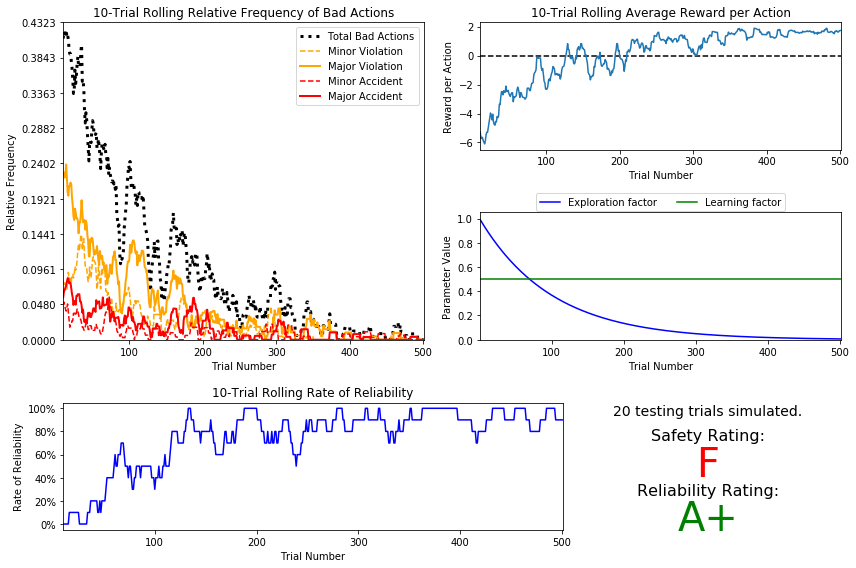

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_alpha_exponential_-0.03_annealing_25.csv
#################################################################


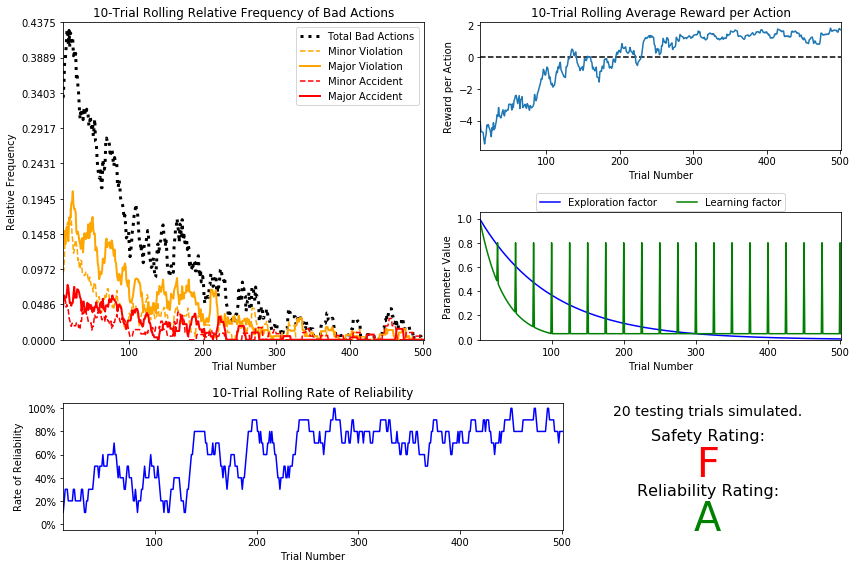

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_alpha_exponential_-0.03_annealing_50.csv
#################################################################


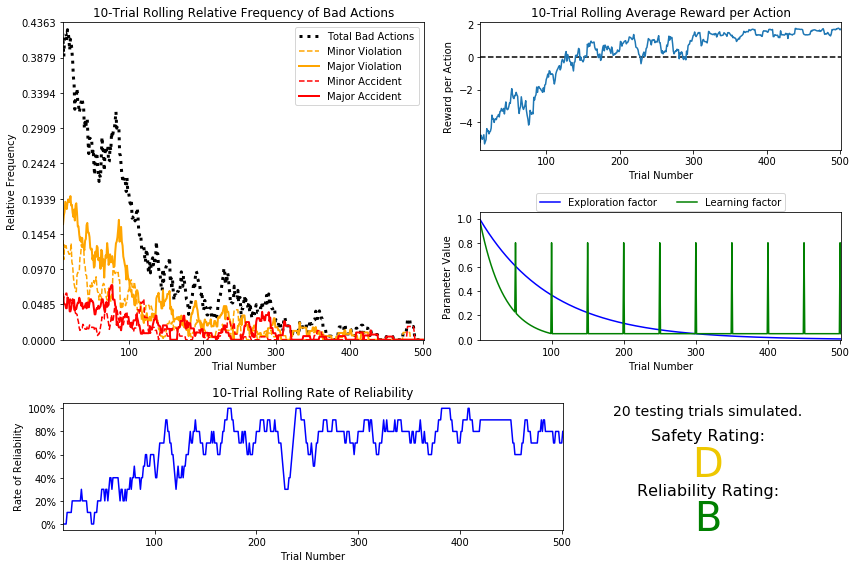

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_alpha_exponential_-0.03_no_annealing.csv
#################################################################


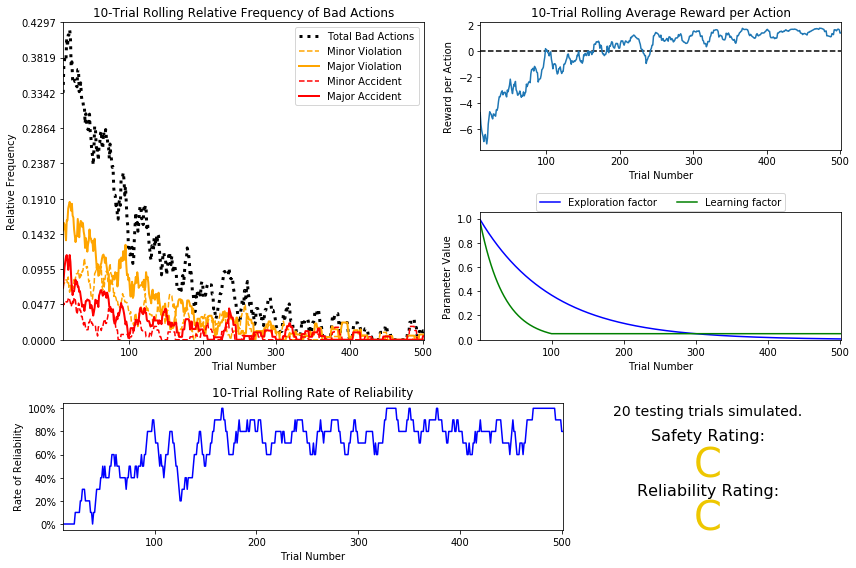

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_annealing_25_alpha_constant_0.01.csv
#################################################################


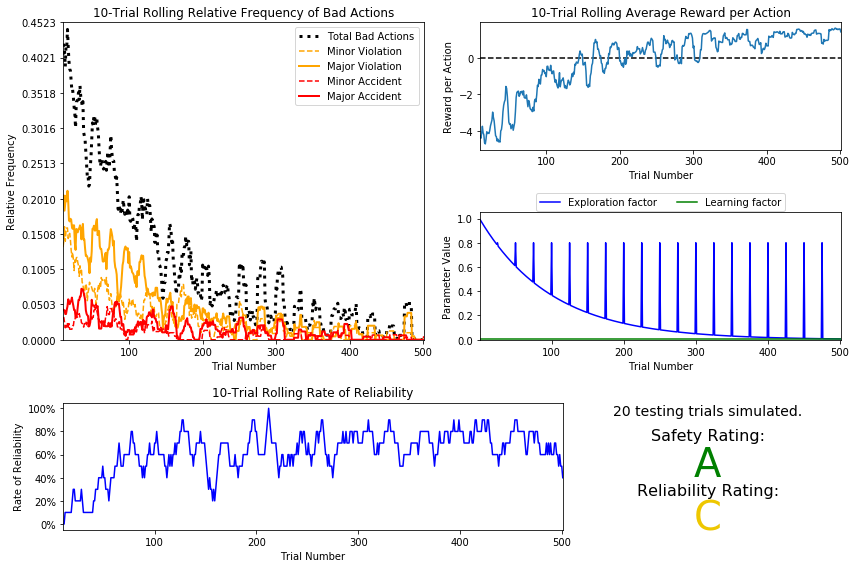

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_annealing_25_alpha_constant_0.05.csv
#################################################################


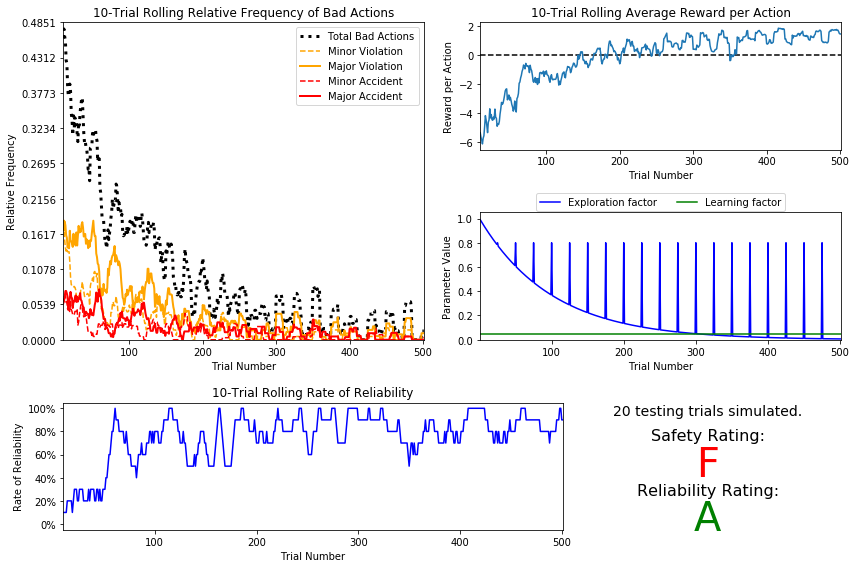

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_annealing_25_alpha_constant_0.1.csv
#################################################################


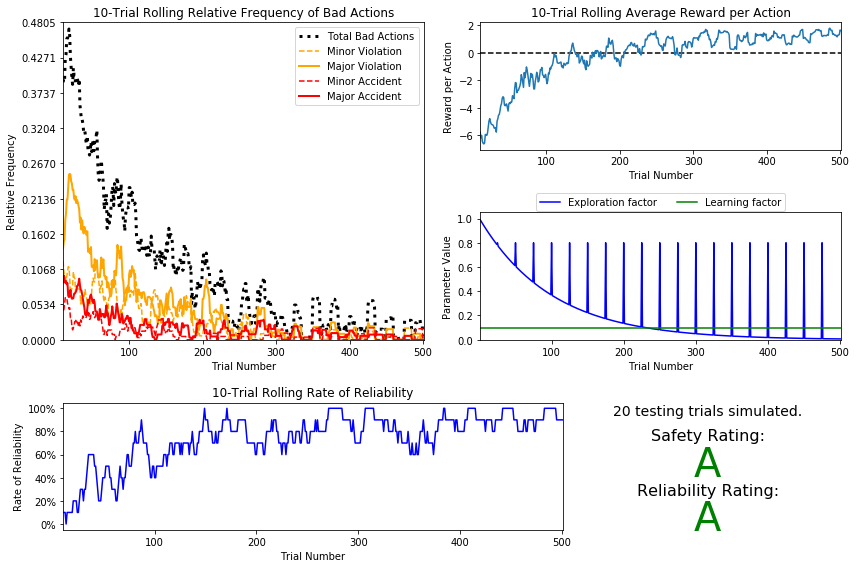

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_annealing_25_alpha_constant_0.5.csv
#################################################################


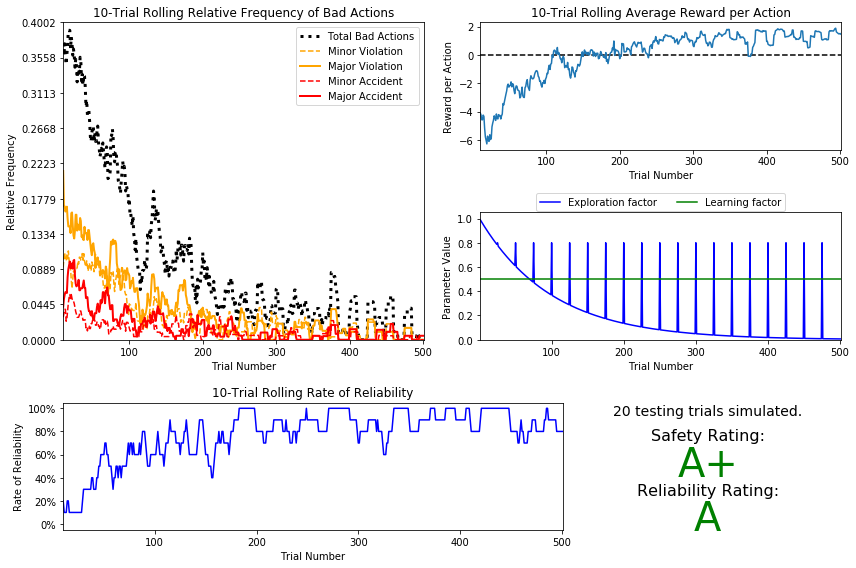

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_annealing_25_alpha_exponential_-0.03_annealing_25.csv
#################################################################


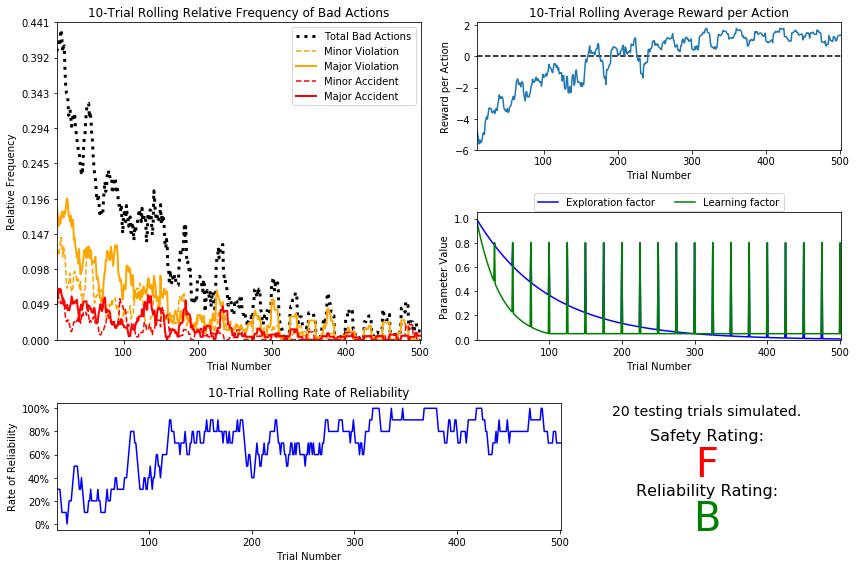

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_annealing_25_alpha_exponential_-0.03_annealing_50.csv
#################################################################


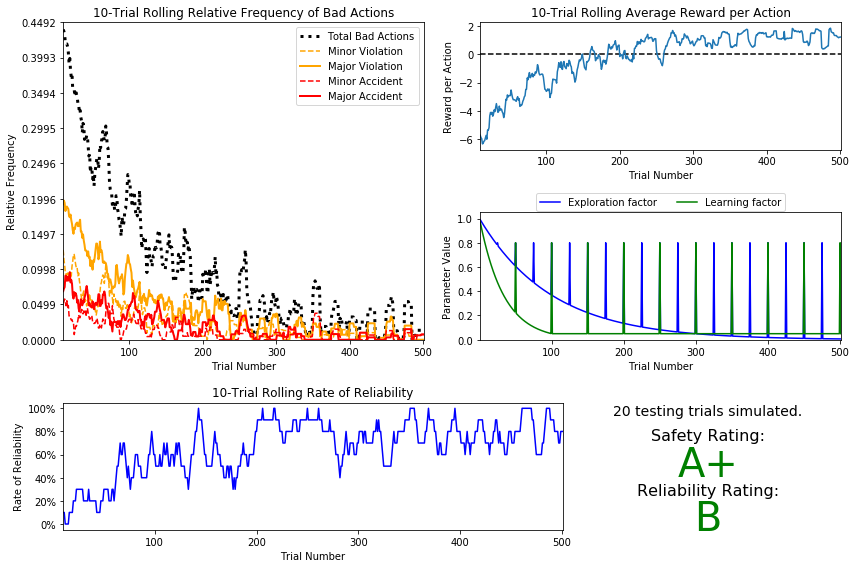

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.01_annealing_25_alpha_exponential_-0.03_no_annealing.csv
#################################################################


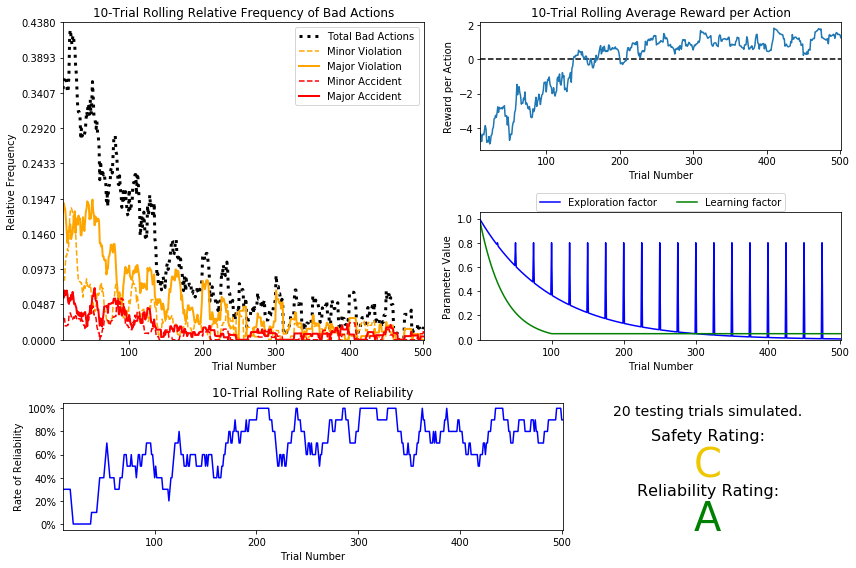

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_constant_0.01.csv
#################################################################


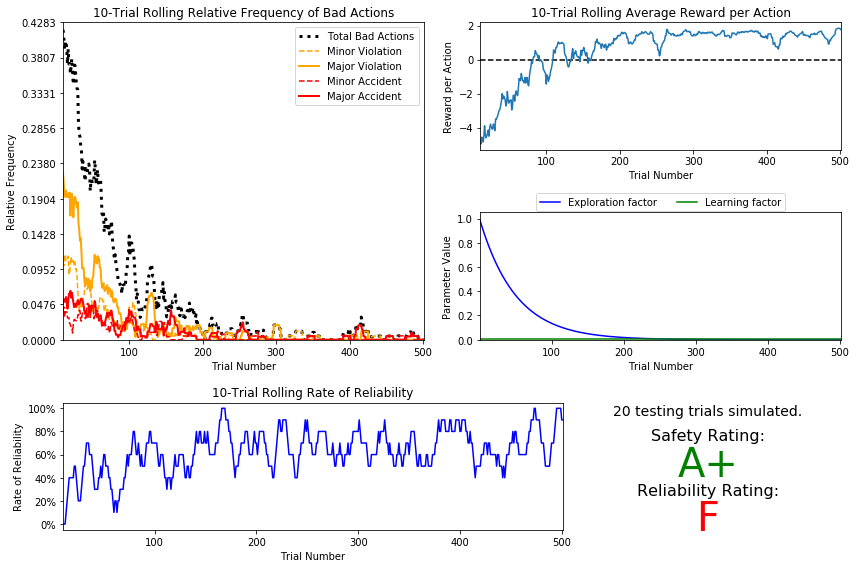

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_constant_0.05.csv
#################################################################


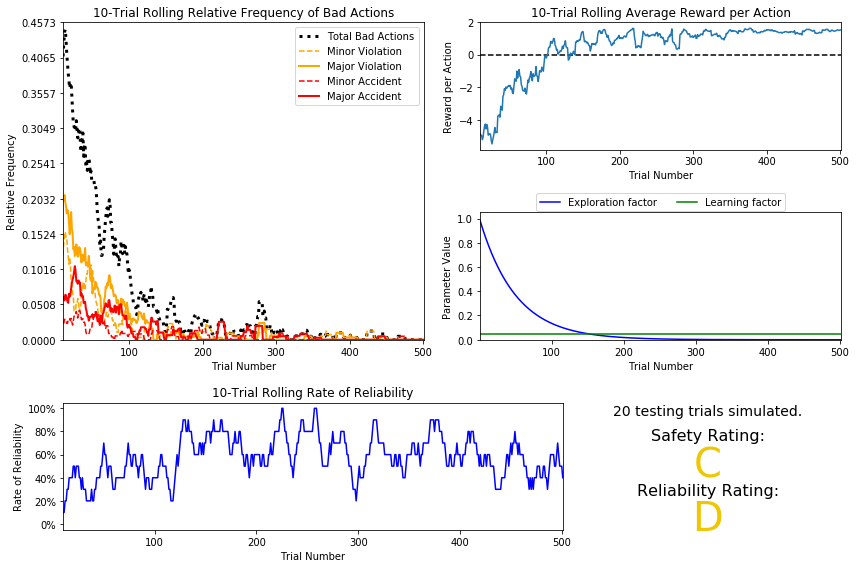

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_constant_0.1.csv
#################################################################


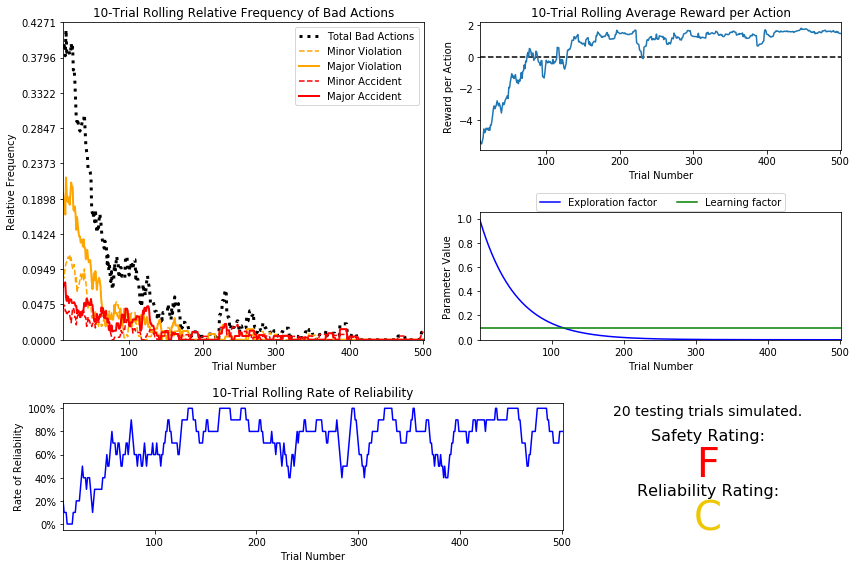

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_constant_0.5.csv
#################################################################


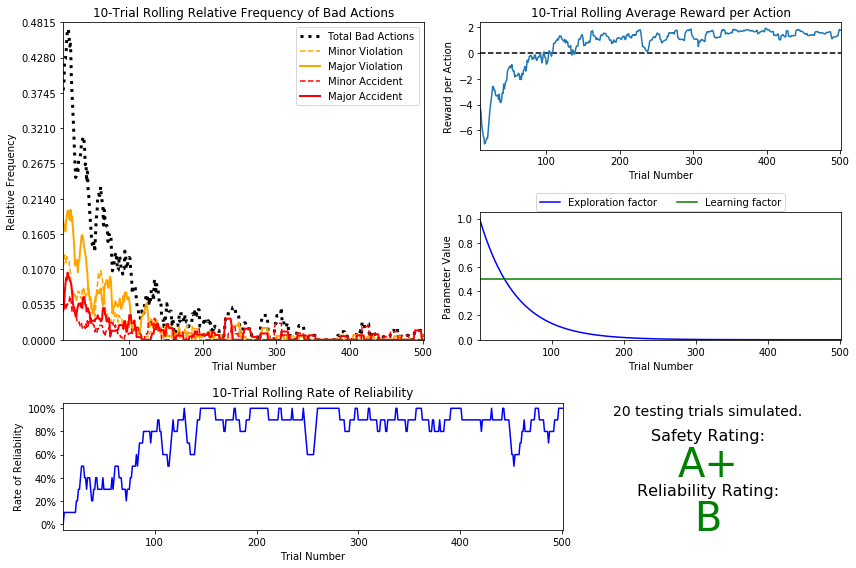

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_exponential_-0.03_annealing_25.csv
#################################################################


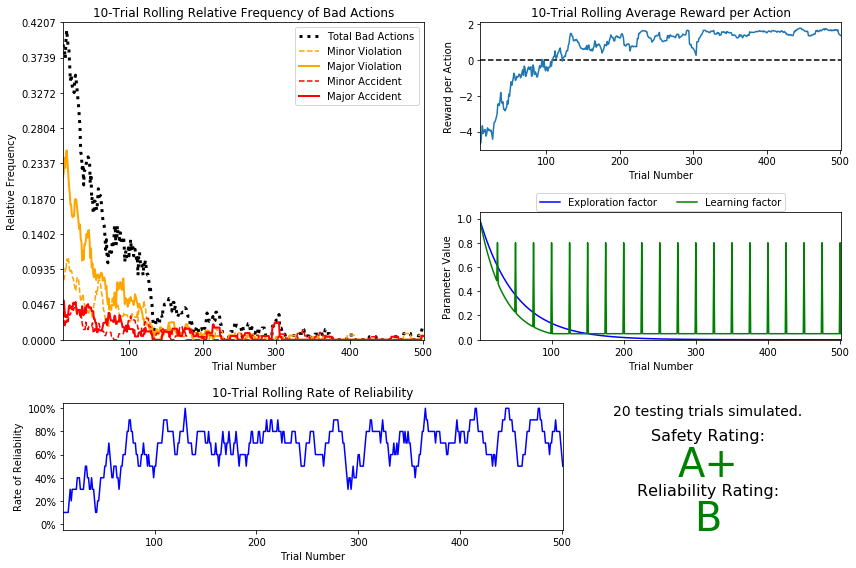

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_exponential_-0.03_annealing_50.csv
#################################################################


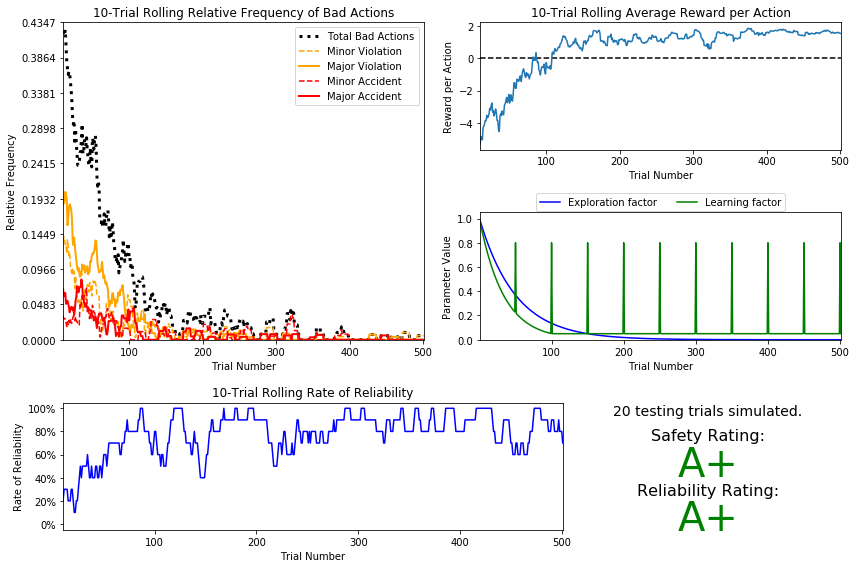

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_exponential_-0.03_no_annealing.csv
#################################################################


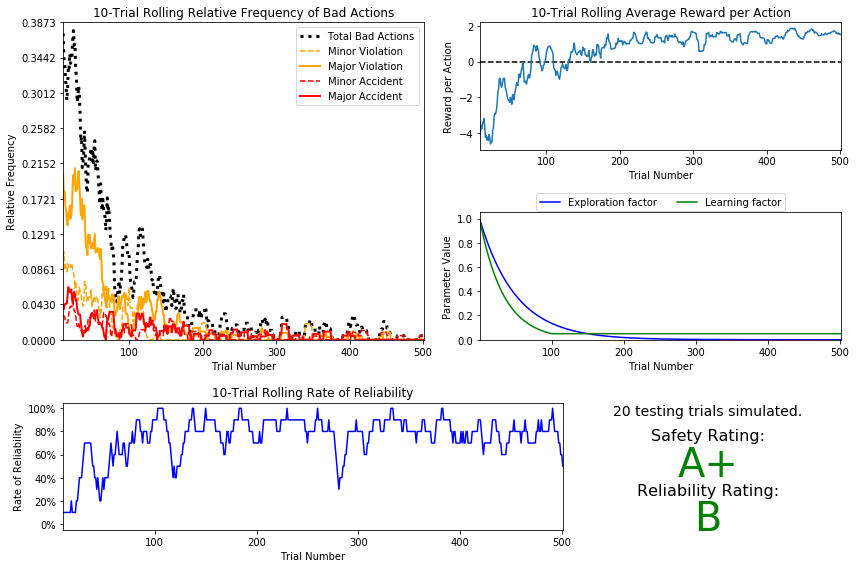

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_100_alpha_constant_0.01.csv
#################################################################


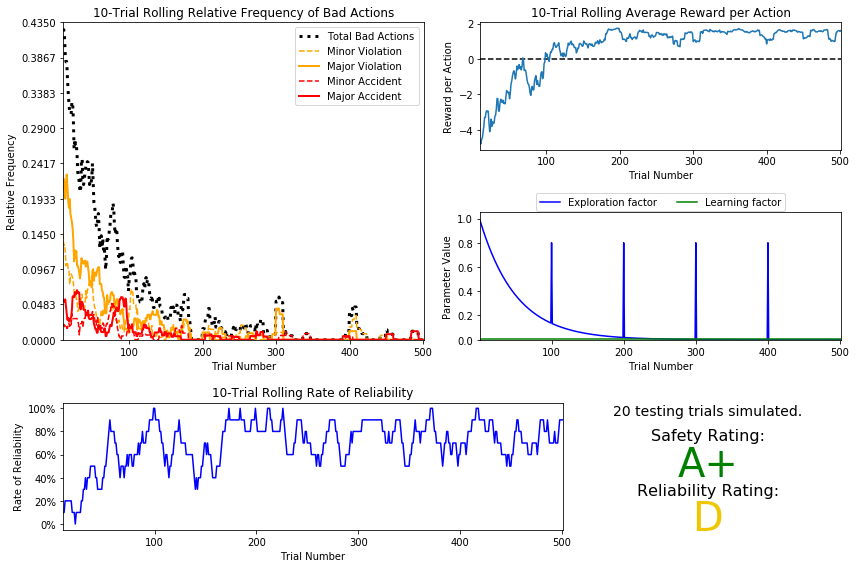

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_100_alpha_constant_0.05.csv
#################################################################


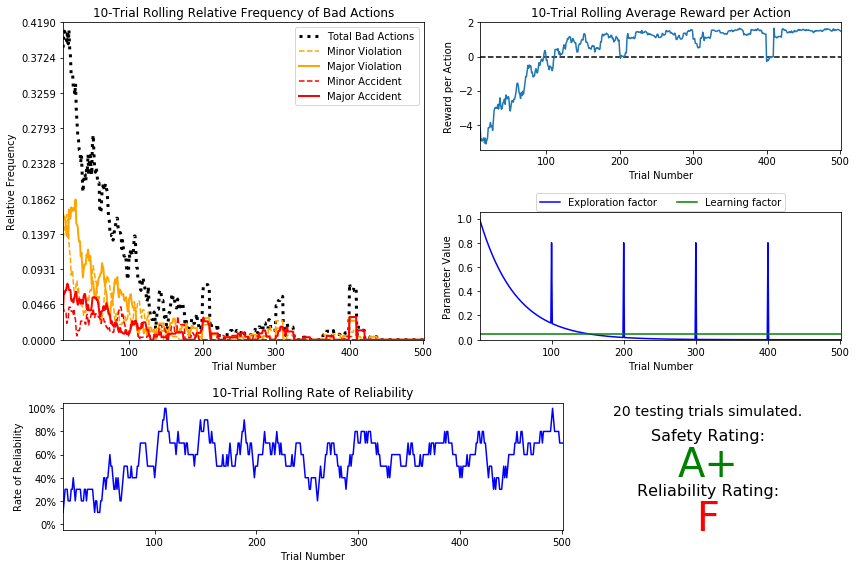

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_100_alpha_constant_0.1.csv
#################################################################


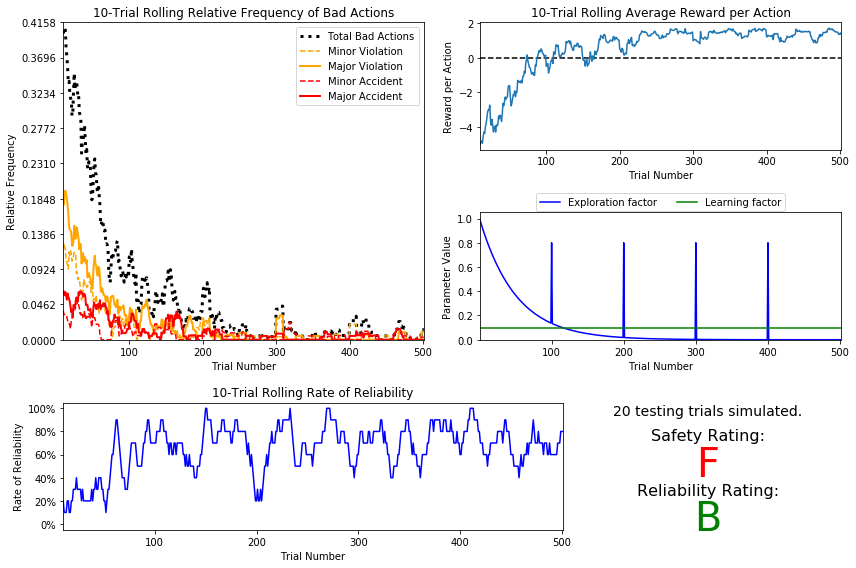

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_100_alpha_constant_0.5.csv
#################################################################


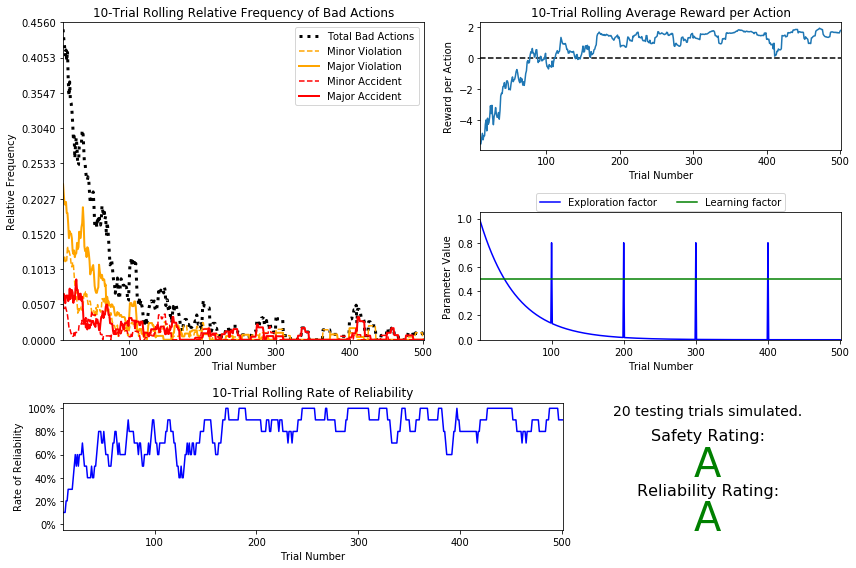

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_100_alpha_exponential_-0.03_annealing_25.csv
#################################################################


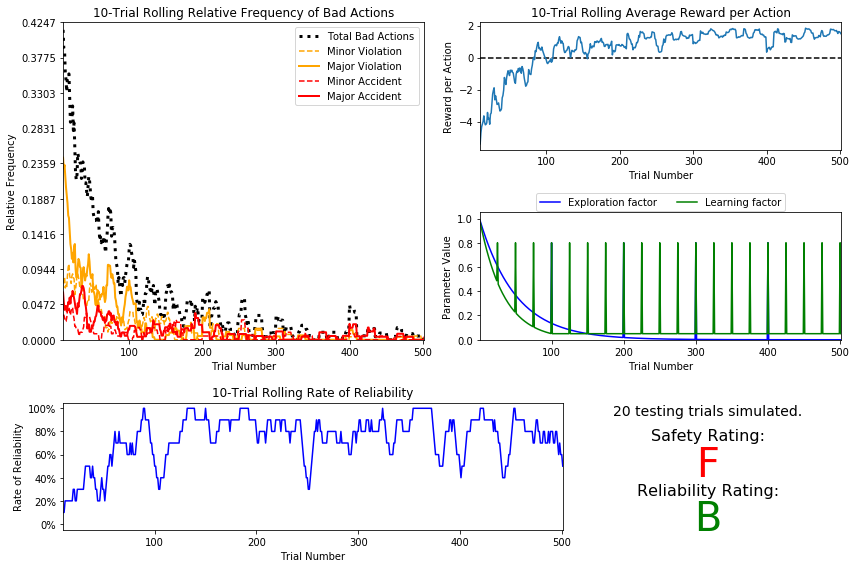

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_100_alpha_exponential_-0.03_annealing_50.csv
#################################################################


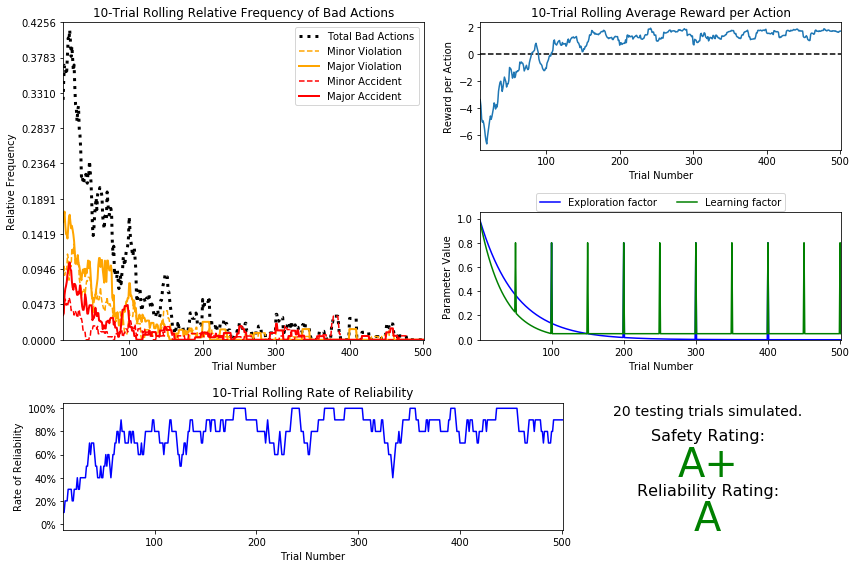

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_100_alpha_exponential_-0.03_no_annealing.csv
#################################################################


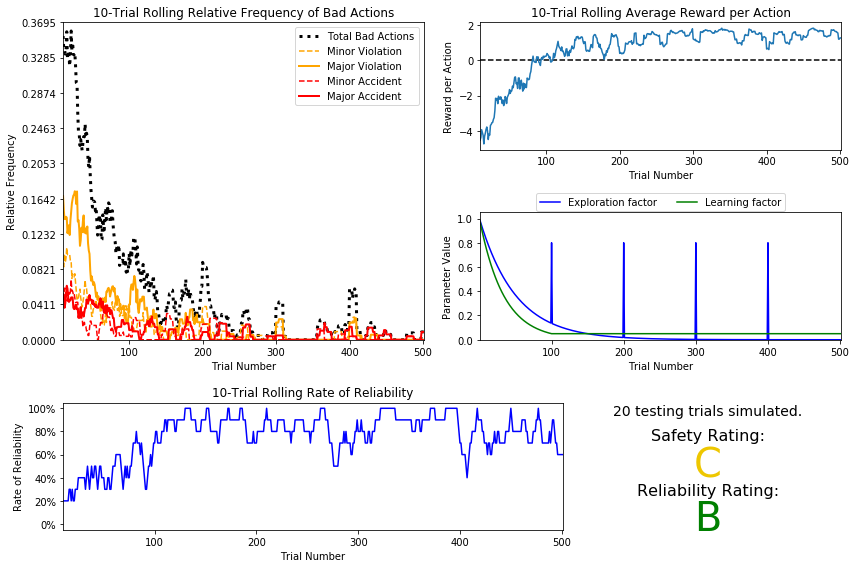

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_25_alpha_constant_0.01.csv
#################################################################


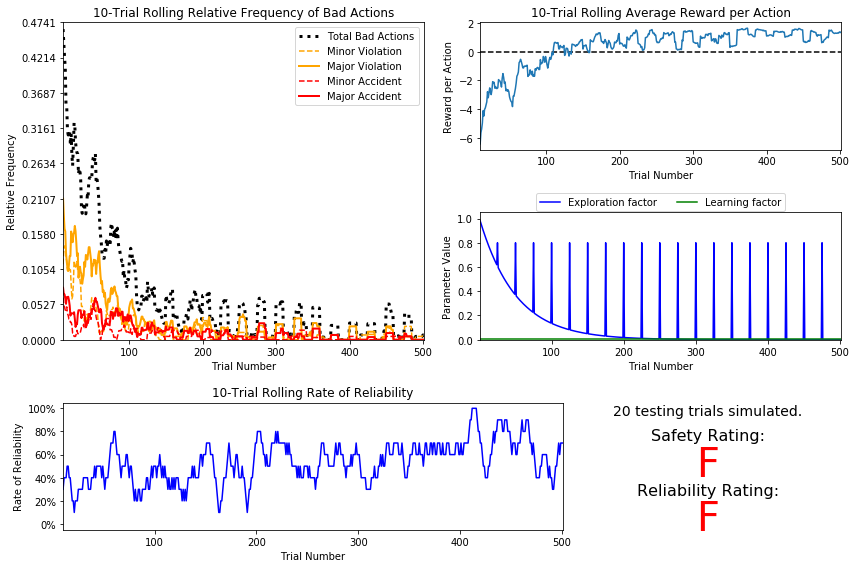

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_25_alpha_constant_0.05.csv
#################################################################


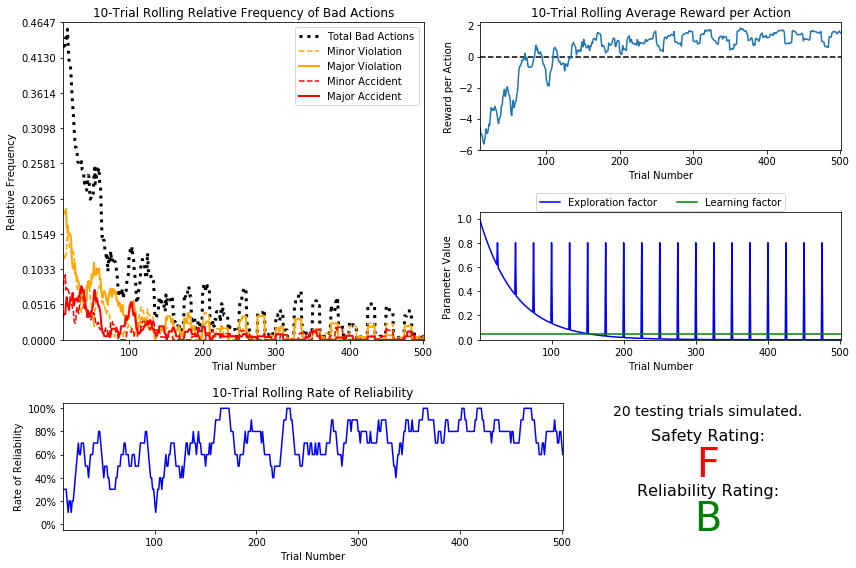

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_25_alpha_constant_0.1.csv
#################################################################


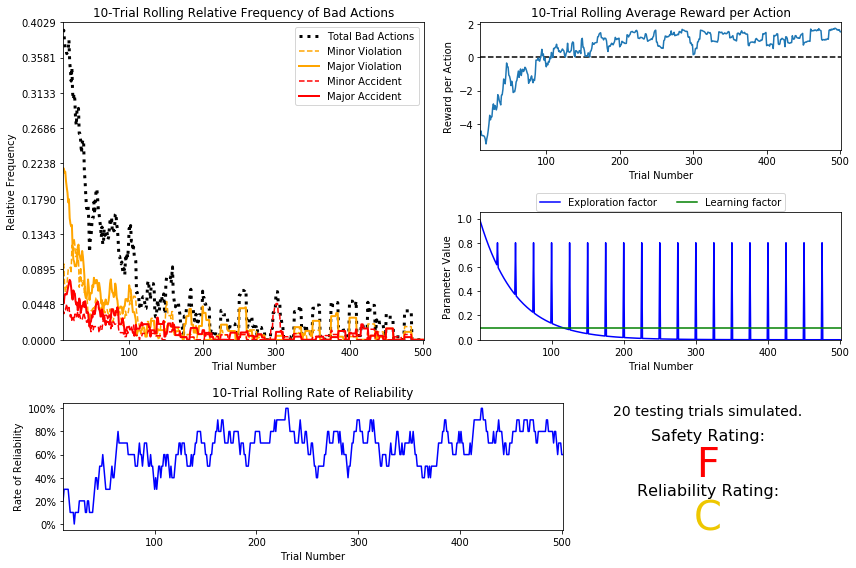

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_25_alpha_constant_0.5.csv
#################################################################


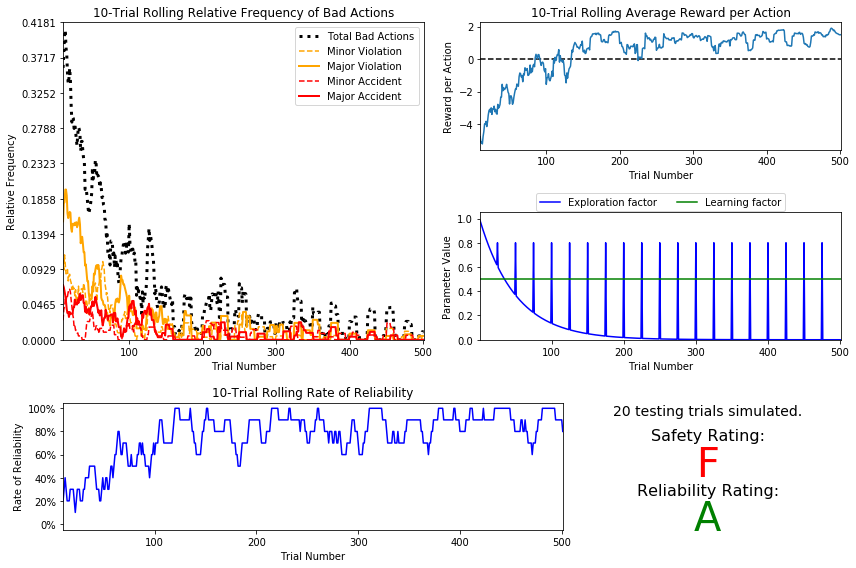

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_25_alpha_exponential_-0.03_annealing_25.csv
#################################################################


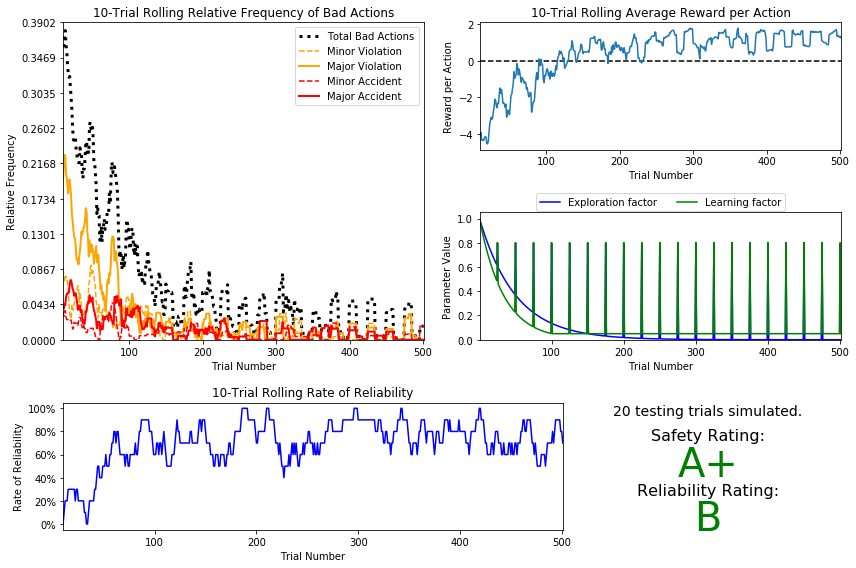

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_25_alpha_exponential_-0.03_annealing_50.csv
#################################################################


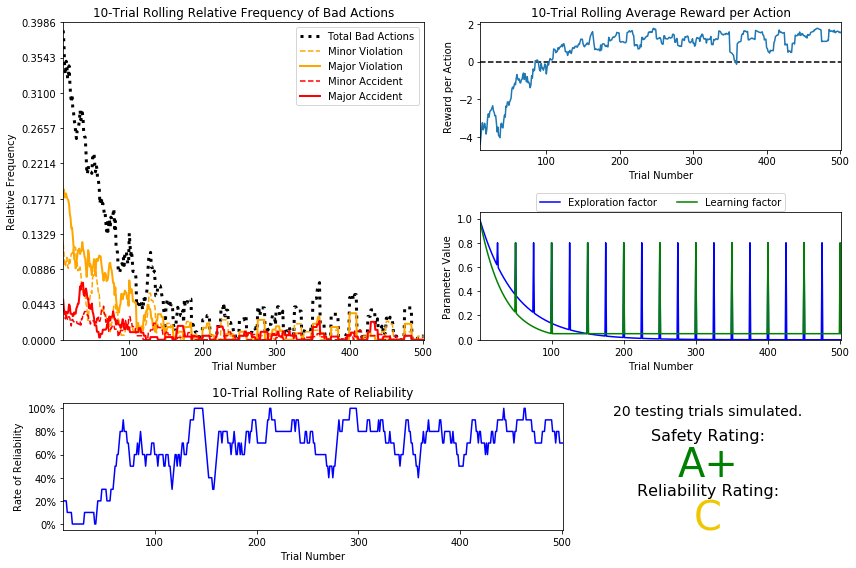

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_annealing_25_alpha_exponential_-0.03_no_annealing.csv
#################################################################


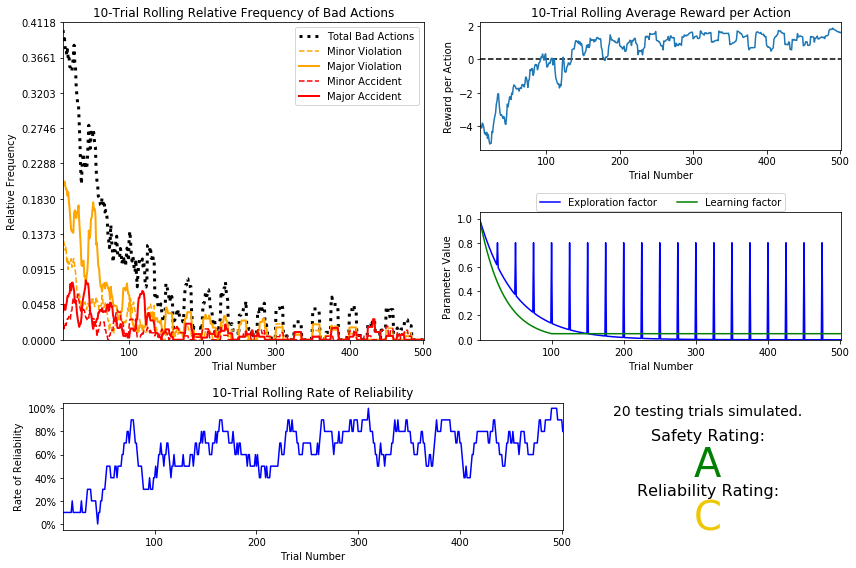

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_alpha_constant_0.01.csv
#################################################################


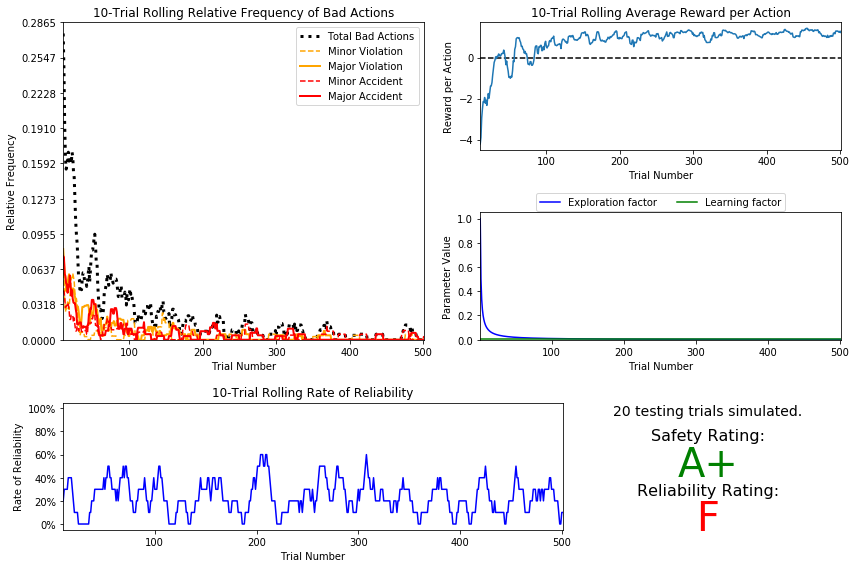

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_alpha_constant_0.05.csv
#################################################################


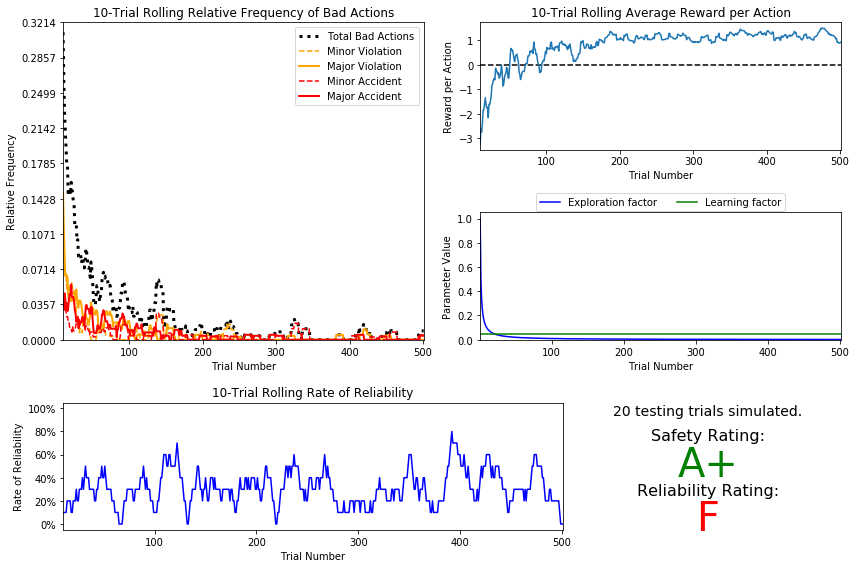

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_alpha_constant_0.1.csv
#################################################################


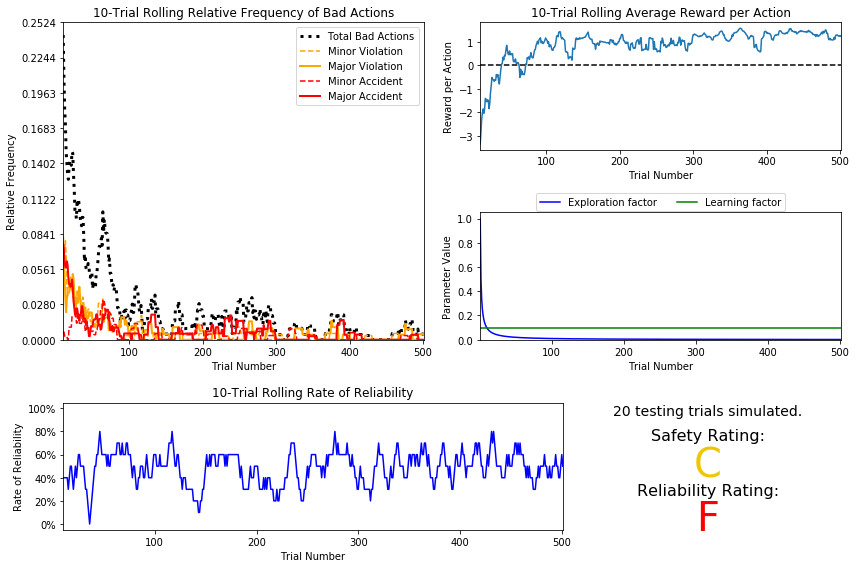

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_alpha_constant_0.5.csv
#################################################################


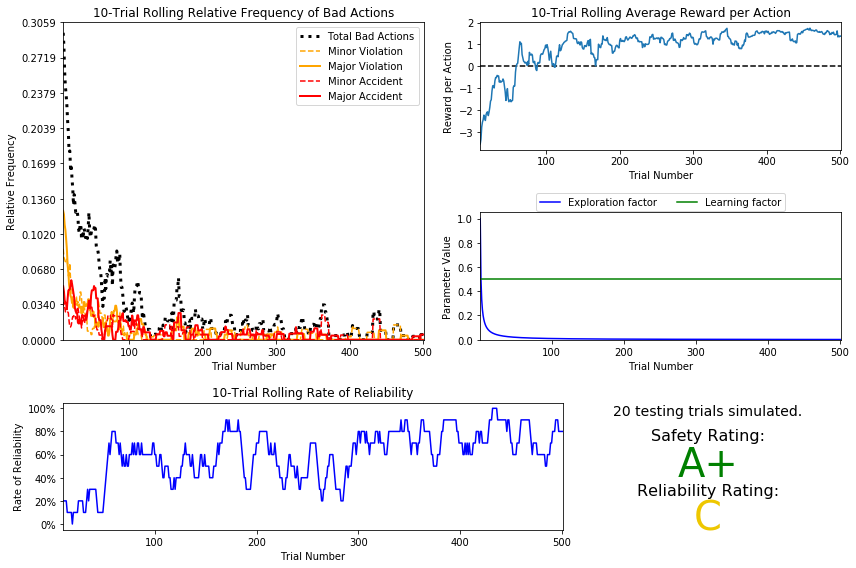

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_alpha_exponential_-0.03_annealing_25.csv
#################################################################


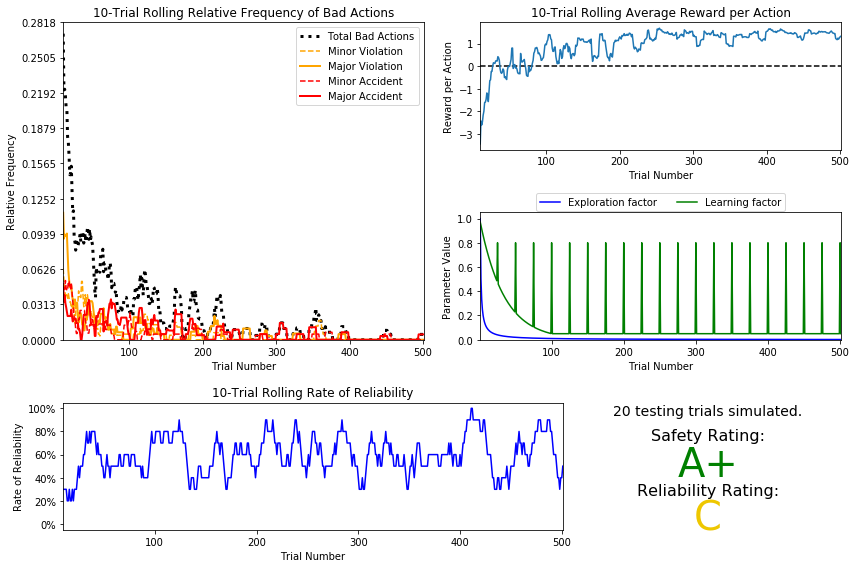

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_alpha_exponential_-0.03_annealing_50.csv
#################################################################


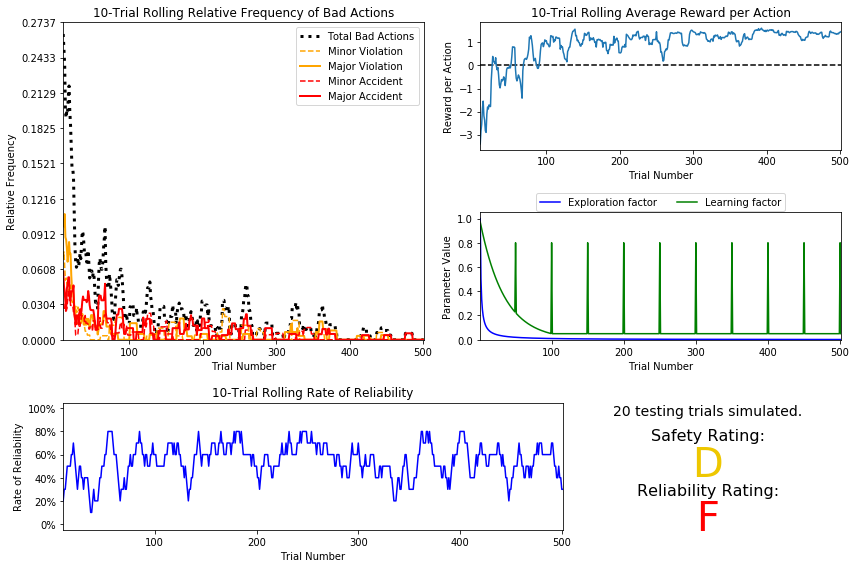

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_alpha_exponential_-0.03_no_annealing.csv
#################################################################


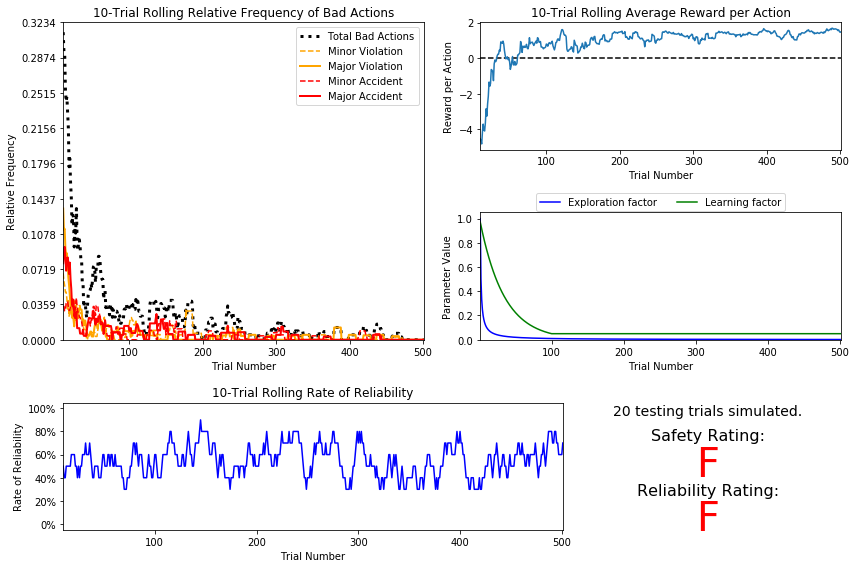

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_annealing_100_alpha_constant_0.01.csv
#################################################################


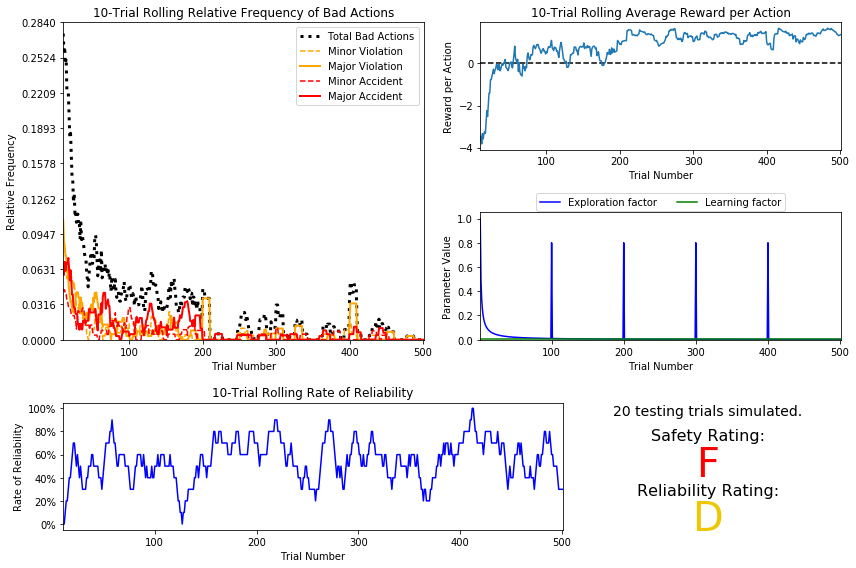

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_annealing_100_alpha_constant_0.05.csv
#################################################################


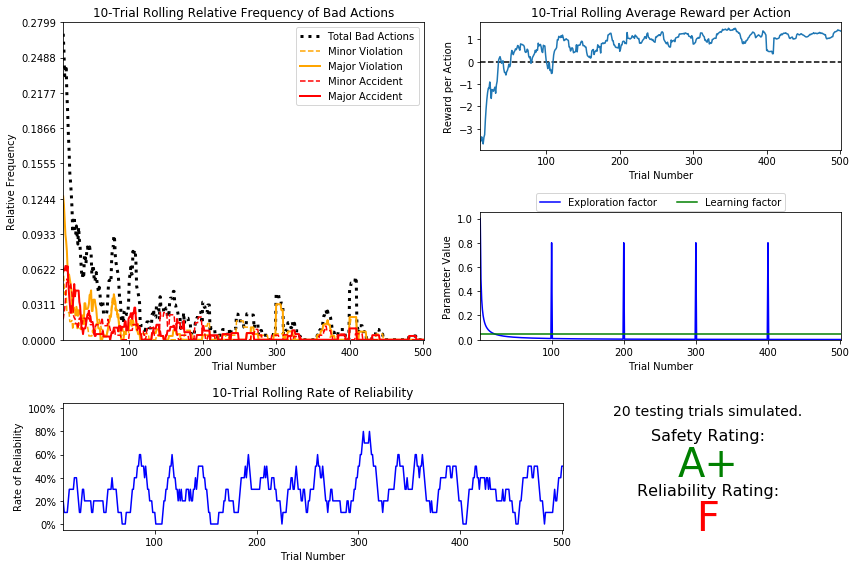

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_annealing_100_alpha_constant_0.1.csv
#################################################################


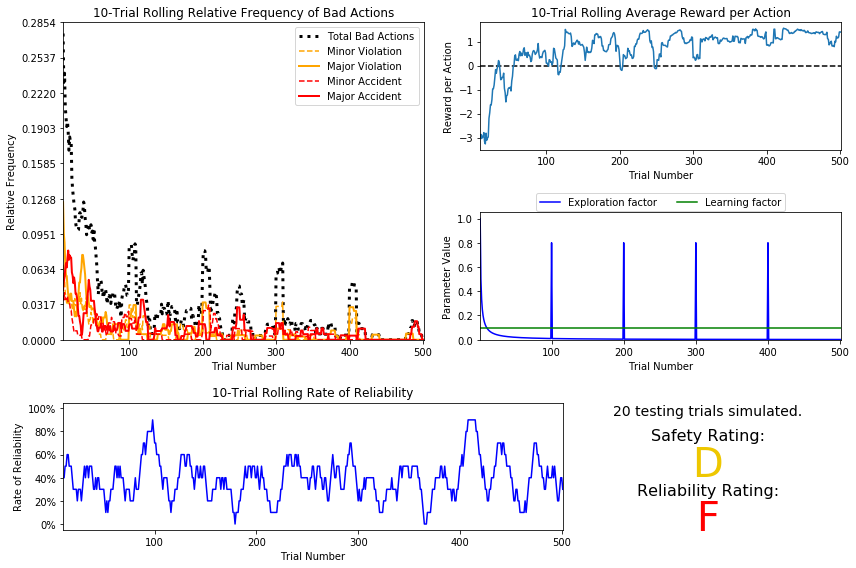

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_annealing_100_alpha_constant_0.5.csv
#################################################################


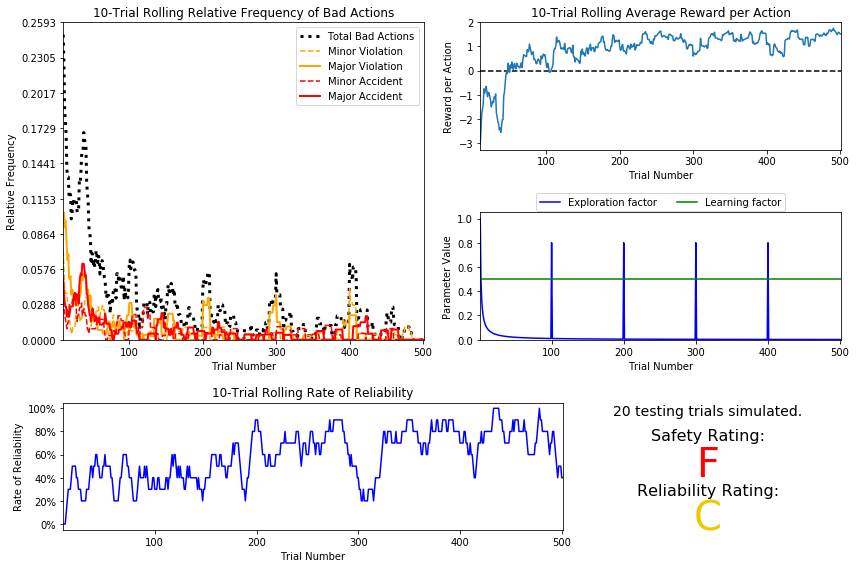

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_annealing_100_alpha_exponential_-0.03_annealing_25.csv
#################################################################


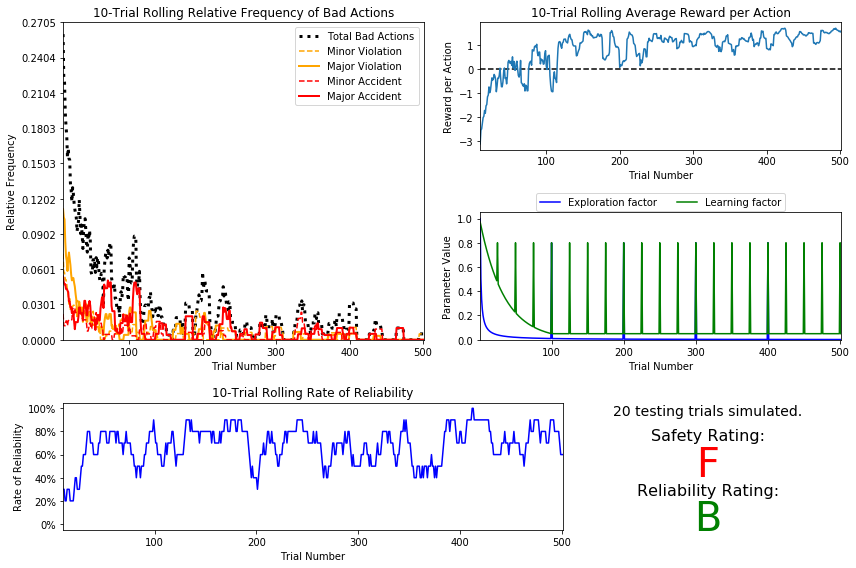

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_annealing_100_alpha_exponential_-0.03_annealing_50.csv
#################################################################


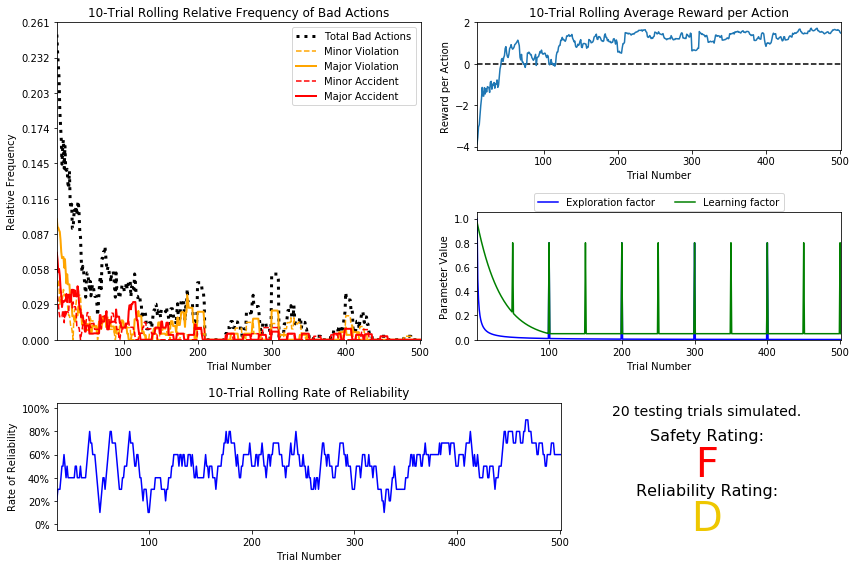

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_annealing_100_alpha_exponential_-0.03_no_annealing.csv
#################################################################


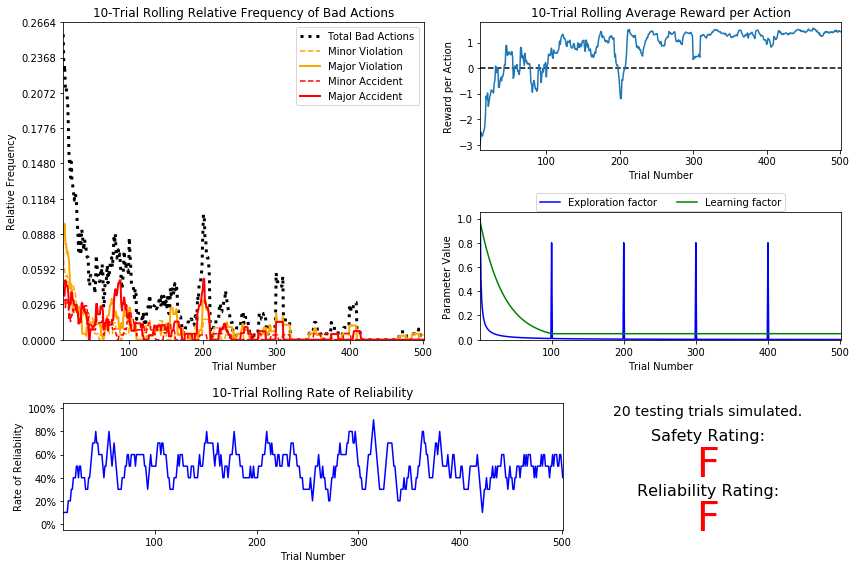

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_quadratic_alpha_constant_0.01.csv
#################################################################


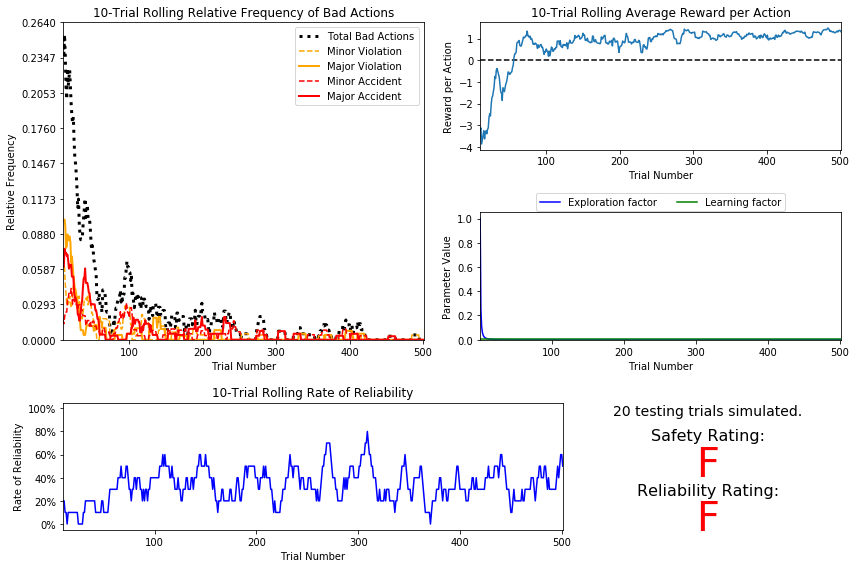

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_quadratic_alpha_constant_0.05.csv
#################################################################


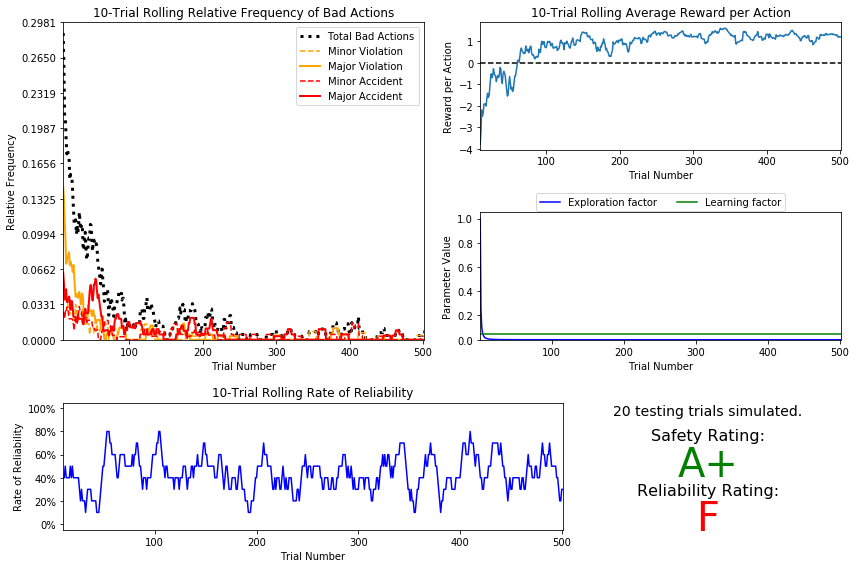

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_quadratic_alpha_constant_0.1.csv
#################################################################


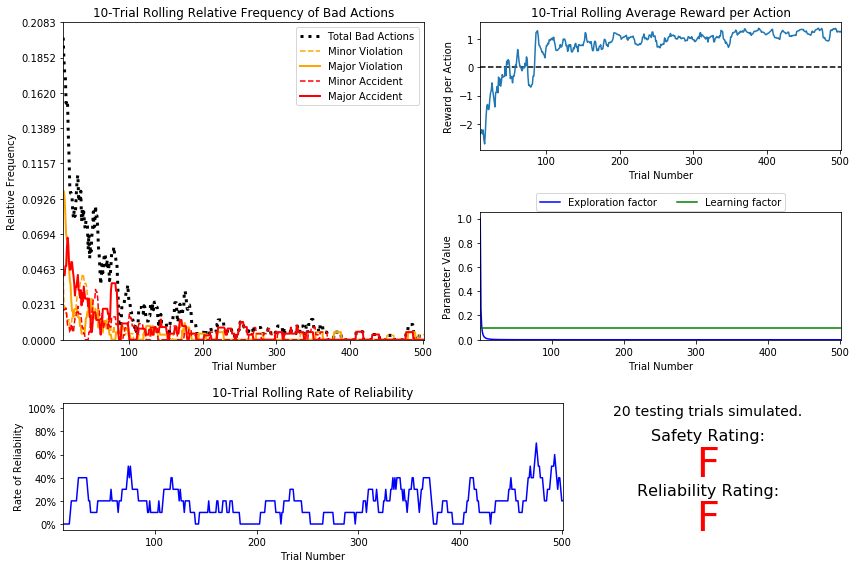

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_quadratic_alpha_constant_0.5.csv
#################################################################


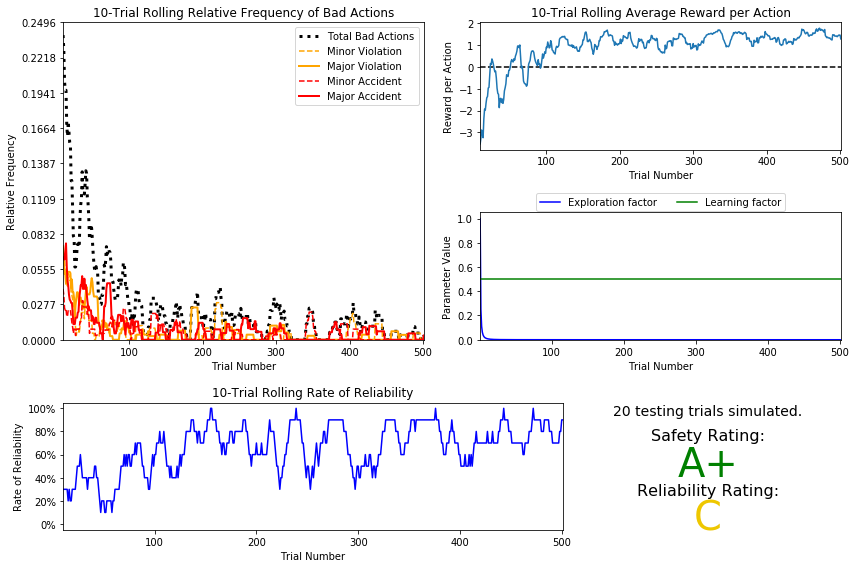

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_quadratic_alpha_exponential_-0.03_annealing_25.csv
#################################################################


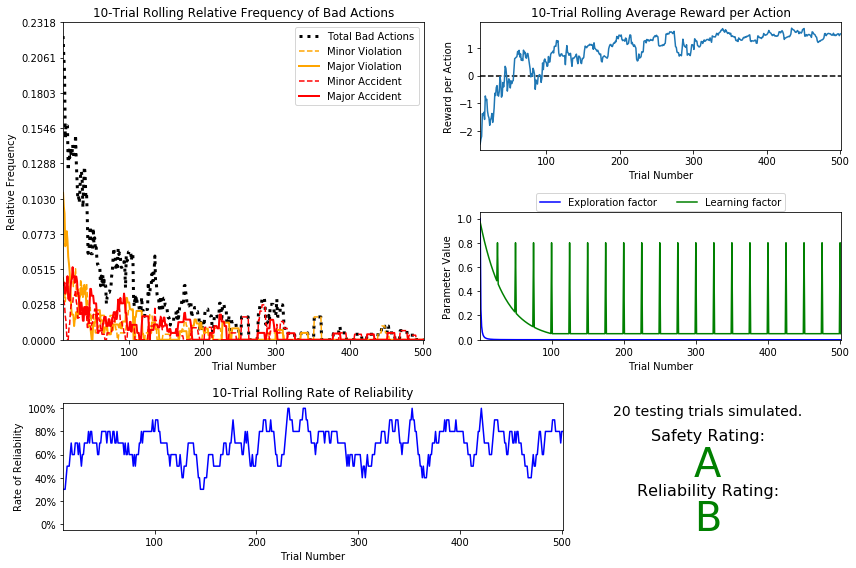

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_quadratic_alpha_exponential_-0.03_annealing_50.csv
#################################################################


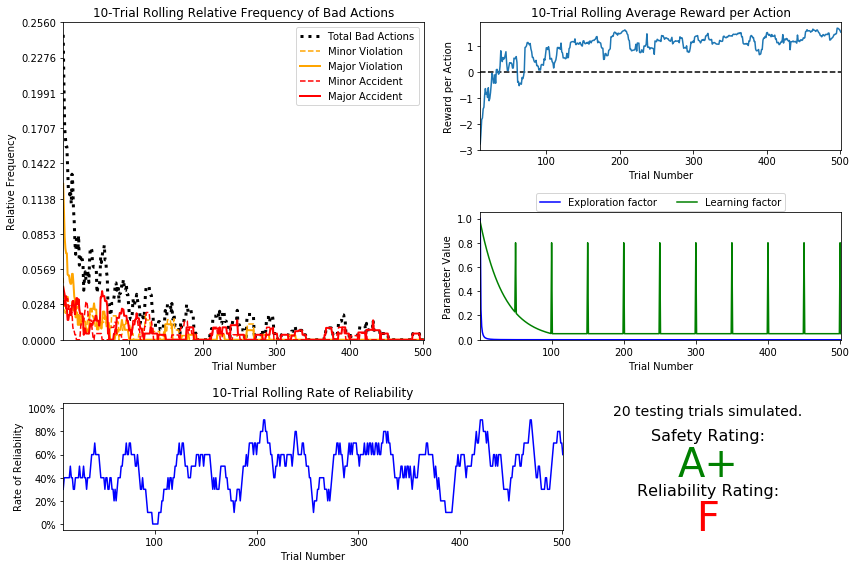

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_inverse_quadratic_alpha_exponential_-0.03_no_annealing.csv
#################################################################


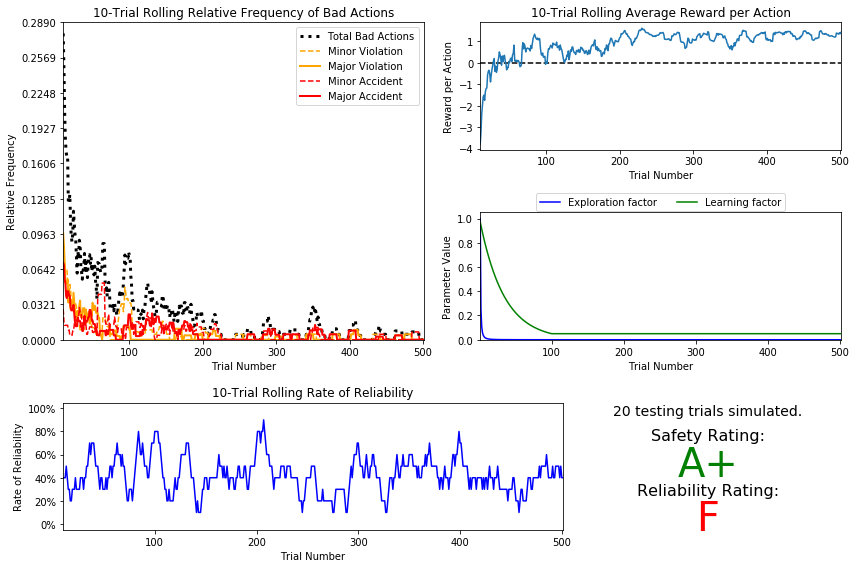

In [5]:
for filename in [os.path.split(path)[1] for path in glob.glob(os.path.join(os.getcwd(), "logs", "*epsilon*.csv"))]:
    print "#################################################################"
    print "RESULTS FOR RUN:", filename
    print "#################################################################"
    vs.plot_trials(filename)

#### Best runs

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_exponential_-0.03_annealing_50.csv
#################################################################


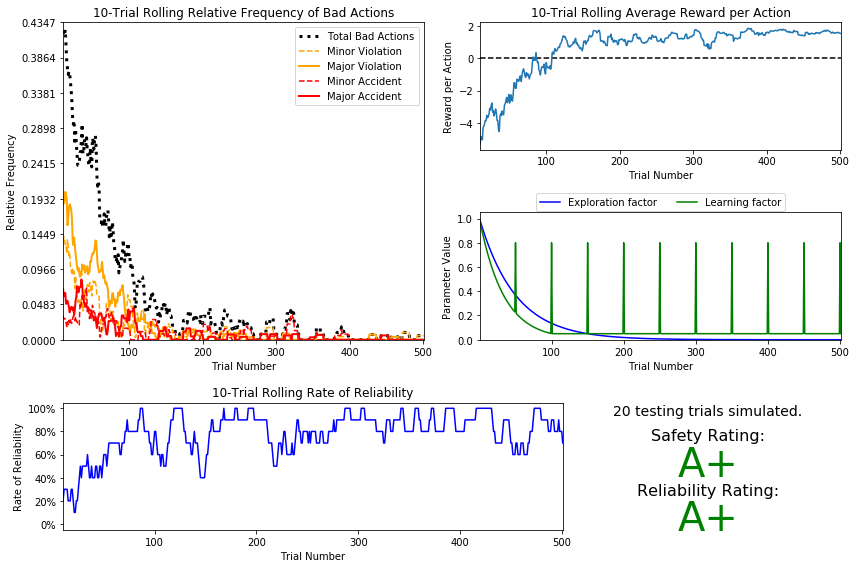

In [6]:
print "#################################################################"
print "RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_exponential_-0.03_annealing_50.csv"
print "#################################################################"
vs.plot_trials("sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_exponential_-0.03_annealing_50.csv")

#################################################################
RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_constant_0.5.csv
#################################################################


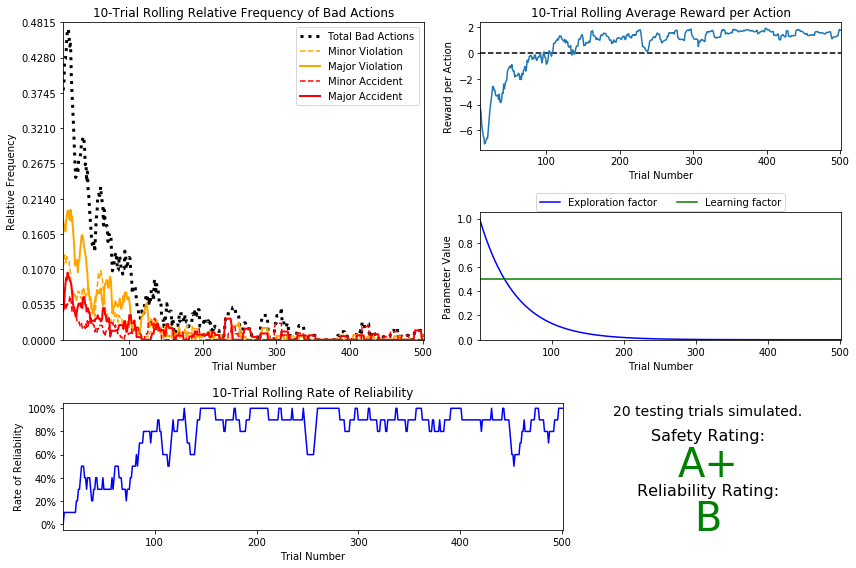

In [7]:
print "#################################################################"
print "RESULTS FOR RUN: sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_constant_0.5.csv"
print "#################################################################"
vs.plot_trials("sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_constant_0.5.csv")

### Question 7
Using the visualization above that was produced from your improved Q-Learning simulation, provide a final analysis and make observations about the improved driving agent like in **Question 6**. Questions you should answer:  
- *What decaying function was used for epsilon (the exploration factor)?*
- *Approximately how many training trials were needed for your agent before begining testing?*
- *What epsilon-tolerance and alpha (learning rate) did you use? Why did you use them?*
- *How much improvement was made with this Q-Learner when compared to the default Q-Learner from the previous section?*
- *Would you say that the Q-Learner results show that your driving agent successfully learned an appropriate policy?*
- *Are you satisfied with the safety and reliability ratings of the *Smartcab*?*

**Answer:**

**Set up**
* I did lots of experiments to **understand the balance between exploration and exploitation** as well as the role of the learning rate better
* In doing so, I tested several **different decay functions for epsilon** (cosine, inverse, inverse quadratic and exponential with different parameter settings) as well as **learning rate strategies** (exponential decay and constant), both as simple decays and as annealing decays. I adapted the agent, simulator and environment modules to allow me to define these functions as a grid and save the results for all of them to make them comparable.
* I ran all of these experiments for **500 training trials** (I set up the tolerance in a way that 500 training trials would be run regardless of the function used) and did 20 testing trials as I found that only this rather large number of trials allowed me to gauge whether the relative frequency of bad actions, the rolling rate of reliability and the average reward per action would stabilize on a desirable level. I found that the way the safety and reliability criteria are set up, a mediocre policy could lead to an A/A rating for a small number of testing trials (just by chance) and the other way round (good policy leading to mediocre results). Thus, **I assessed the results primarily based on the development of the rolling rate of reliability and the relative frequency of bad actions**.

**Results**
* My experiments indicate that:
    * For epsilon, **a decreasing decay rate (second derivative negative) seems to be working better than an increasing decay rate (second derivative positive)** independent of the learning rate (compare cosine decay to all others)
    * Given the same decay function for epsilon, a **higher learning rate seems to support learning reliability better** (learning rate annealing instead of simple decay helps somewhat, but just plain constant learning rate at a higher level seems to be at least as good)
    * **Safety can be learned quite well** (although not perfectly) over a few hundred trials for different epsilon decay functions. However, **using annealing for the epsilon decay hinders progress substantially**. On the other hand, epsilon annealing paired with a high learning rate does seem to lead to good progress in learning reliability.
    * The combination of epsilon decay and learning rate strategy that seems to work best is an exponential decay (base e, exponent -0.02 * n_trials) for epsilon and a rather high constant learning rate (0.5) or learning rate annealing (e.g. exponential decay and bumping it to 0.8 on every 50th try)
    * The functions for epsilon and alpha decay I finally chose is the following:
        * `epsilon = math.pow(math.e, -0.02 * n_trials))`
        * `alpha = 0.8 if n_trials % 50 == 0 else max(math.pow(math.e, -0.03 * n_trials), 0.05))` (just setting alpha = 0.5 worked comparably well though)
    
* I would be confident enough to say that my driving agent **successfully learned an appropriate policy, albeit not the optimal policy** as in some trials the destination is not reached or traffic violations occur.
* As I have argued above, I feel that the ratings are set up in a way that both good and bad results can occur by chance. Thus I was more interested in the first and second derivative of the relative frequency of bad actions and the rolling rate of reliability (does their trend point into the right direction? how fast is the agent making progress?). In the end, I was happy with the results, in particular as I could observe **significant differences between the distinct functions**.

### Define an Optimal Policy

Sometimes, the answer to the important question *"what am I trying to get my agent to learn?"* only has a theoretical answer and cannot be concretely described. Here, however, you can concretely define what it is the agent is trying to learn, and that is the U.S. right-of-way traffic laws. Since these laws are known information, you can further define, for each state the *Smartcab* is occupying, the optimal action for the driving agent based on these laws. In that case, we call the set of optimal state-action pairs an **optimal policy**. Hence, unlike some theoretical answers, it is clear whether the agent is acting "incorrectly" not only by the reward (penalty) it receives, but also by pure observation. If the agent drives through a red light, we both see it receive a negative reward but also know that it is not the correct behavior. This can be used to your advantage for verifying whether the **policy** your driving agent has learned is the correct one, or if it is a **suboptimal policy**.

### Question 8

1. Please summarize what the optimal policy is for the smartcab in the given environment. What would be the best set of instructions possible given what we know about the environment? 
   _You can explain with words or a table, but you should thoroughly discuss the optimal policy._

2. Next, investigate the `'sim_improved-learning.txt'` text file to see the results of your improved Q-Learning algorithm. _For each state that has been recorded from the simulation, is the **policy** (the action with the highest value) correct for the given state? Are there any states where the policy is different than what would be expected from an optimal policy?_ 

3. Provide a few examples from your recorded Q-table which demonstrate that your smartcab learned the optimal policy. Explain why these entries demonstrate the optimal policy.

4. Try to find at least one entry where the smartcab did _not_ learn the optimal policy.  Discuss why your cab may have not learned the correct policy for the given state.

Be sure to document your `state` dictionary below, it should be easy for the reader to understand what each state represents.

**Answer:** 

**Optimal Policy**:
In short, the optimal policy would be to always follow the next waypoint if traffic rules allow to do so. If they do not, wait (i.e. choose action `None`). To be more precise this would for example mean (given U.S. traffic rules):
* If ("light", "red") do None regardless of the next waypoint
* If ("light", "green") and ("oncoming", None) and ("left", None) and ("right", None) follow the waypoint
* If ("light", "green") and ("oncoming", "forward") and ("left", "right") and ("right", "right") and ("waypoint", "right"), follow the waypoint and turn right
* If ("light", "green") and ("oncoming", "forward") and ("left", "right") and ("right", "right") and ("waypoint", "left"), yield to oncoming traffic (choose action None) and try to follow the waypoint if the next state allows for it.

**Examples from sim_improved-learning_epsilon_exponential_base_e_exp_-0.02_alpha_exponential_-0.03_annealing_50.txt:

**Optimal**
* (('next_waypoint', 'forward'), ('light', 'green'), ('oncoming', None), ('left', None), ('right', None))
    * forward : 0.14
    * left : -1.01
    * right : 0.00
    * None : 0.00
    
*The light is green, the destination lies in forward direction and no other traffic is interfering. Thus, going forward is the optimal thing to do.*

* (('next_waypoint', 'forward'), ('light', 'red'), ('oncoming', None), ('left', 'forward'), ('right', 'left'))
    * forward : -17.44
    * left : -3.92
    * right : -6.76
    * None : 1.58

*The light is red. Regardless of the next waypoint, the agent should idle and wait for the light to turn green. That is what it has learned.*

* (('next_waypoint', 'forward'), ('light', 'green'), ('oncoming', 'forward'), ('left', 'forward'), ('right', None))
    * forward : 1.02
    * left : -4.41
    * right : 0.00
    * None : 0.00
    
*The light is green and no traffic is hindering the agent from following the waypoint and going forward. Going left however (as the agent has apparently tried) is a bad idea due to incoming traffic.*

**Suboptimal**

* (('next_waypoint', 'forward'), ('light', 'green'), ('oncoming', 'right'), ('left', 'right'), ('right', None))
    * forward : 0.00
    * left : 0.00
    * right : 0.31
    * None : 0.00

*The light is green, the next waypoint is forward and the traffic around our agent should not interfere with it going forward. However, the agent has learned to go right as it hasn't explored any of the other states and going right was a legal operation giving some reward.*

-----
### Optional: Future Rewards - Discount Factor, `'gamma'`
Curiously, as part of the Q-Learning algorithm, you were asked to **not** use the discount factor, `'gamma'` in the implementation. Including future rewards in the algorithm is used to aid in propagating positive rewards backwards from a future state to the current state. Essentially, if the driving agent is given the option to make several actions to arrive at different states, including future rewards will bias the agent towards states that could provide even more rewards. An example of this would be the driving agent moving towards a goal: With all actions and rewards equal, moving towards the goal would theoretically yield better rewards if there is an additional reward for reaching the goal. However, even though in this project, the driving agent is trying to reach a destination in the allotted time, including future rewards will not benefit the agent. In fact, if the agent were given many trials to learn, it could negatively affect Q-values!

### Optional Question 9
*There are two characteristics about the project that invalidate the use of future rewards in the Q-Learning algorithm. One characteristic has to do with the *Smartcab* itself, and the other has to do with the environment. Can you figure out what they are and why future rewards won't work for this project?*

**Answer:**
* I assume that one issue would be that both the agent and the destination are placed randomly on the map for each trial. As the learned future rewards depend on where the agent is located relative to the destination at the onset of each trial, incorporating it in learning a policy that is transferable between trials would hinder progress: This kind of transfer between trials is just not possible as each of them is unique depending on the initial set up. 
* Further, future rewards would be hard to determine correctly anyway as the state of the environment a few steps ahead cannot easily be determined. Other traffic and traffic lights are constantly changing. Just the waypoint could assessed deterministically and thus I would expect that this part could be learned. As the optimal action is highly dependent on the other factors (traffic, lights), however, I do not see how future rewards could even be learned well in the given environment.

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  
**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.